In [149]:
# !pip install hiplot
# !pip install shap
# !conda install -c conda-forge shap -y
# !pip install keras tensorflow deap pandas scikit-learn
# !pip install scikeras
# !pip install deap pandas scikit-learn
# !pip install seaborn
# !pip install keras-tuner
# !pip install --upgrade tensorflow --user

data dictionary
nvdi - normalized difference vegetation index
tave - temperature average
tmax - temperature max
tmin - temperature min
heat_index
pr - precepitation
solar_rad - solar radiation
uv_rad - ultra-violet radiation
wind speed
relative humidity

https://dbdocs.io/lacuna-fund-project-team/Project-CCHAIN?table=climate_atmosphere&schema=public&view=table_structure

# Import Modules

In [150]:
import tensorflow as tf

gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

In [151]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np
import math
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from sklearn.preprocessing import MinMaxScaler
# plt.rcParams['font.family'] = 'URW Bookman'

from sklearn.impute import KNNImputer

import seaborn as sns
import hiplot as hip
import time

# Read CSVs

In [152]:
all_weather_df = pd.read_csv('climate_atmosphere.csv')
all_pollutants_df = pd.read_csv('climate_air_quality.csv')
all_land_df = pd.read_csv('climate_land.csv')

In [153]:
all_holidays_df = pd.read_csv('philippines_holidays_2003_2022_df.csv', index_col=0)

In [154]:
all_holidays_df.date = pd.to_datetime(all_holidays_df['date'])

In [155]:
all_location_df = pd.read_csv('location.csv')

In [156]:
mandaluyong_location_df = all_location_df.query('adm3_en == "City of Mandaluyong"')
mandaluyong_location_df.adm4_en.unique()

array(['Wack-wack Greenhills', 'Daang Bakal', 'Pleasant Hills',
       'Barangka Ibaba', 'Barangka Ilaya', 'Pag-asa', 'Barangka Drive',
       'Malamig', 'Hagdang Bato Libis', 'Addition Hills', 'Buayang Bato',
       'Highway Hills', 'Harapin Ang Bukas', 'Vergara', 'Mauway',
       'Barangka Itaas', 'Bagong Silang', 'Hagdang Bato Itaas',
       'San Jose', 'Hulo', 'Burol', 'Old Zañiga', 'Mabini-J. Rizal',
       'Poblacion', 'New Zañiga', 'Namayan', 'Plainview'], dtype=object)

In [157]:
mandaluyong_location_codes_df = mandaluyong_location_df['adm4_pcode'].to_list()
len(mandaluyong_location_codes_df)

27

In [158]:
mandaluyong_weather_df = all_weather_df[all_weather_df['adm4_pcode'].isin(mandaluyong_location_codes_df)]
mandaluyong_pollutants_df = all_pollutants_df[all_pollutants_df['adm4_pcode'].isin(mandaluyong_location_codes_df)]
mandaluyong_land_df = all_land_df[all_land_df['adm4_pcode'].isin(mandaluyong_location_codes_df)]

# Pre Processing Data (Data Cleaning)

### Mandaluyong land df

In [159]:
display(mandaluyong_land_df.head())
#missing values
mandaluyong_land_df.isna().sum()

,uuid,adm4_pcode,date,freq,ndvi
6055845,CLAND5C67A5,PH137401001,2003-01-01,D,0.25
6055846,CLAND5C67A6,PH137401001,2003-01-02,D,0.25
6055847,CLAND5C67A7,PH137401001,2003-01-03,D,0.25
6055848,CLAND5C67A8,PH137401001,2003-01-04,D,0.24
6055849,CLAND5C67A9,PH137401001,2003-01-05,D,0.24


uuid            0
adm4_pcode      0
date            0
freq            0
ndvi          104
dtype: int64

In [160]:
# Convert date column to datetime
mandaluyong_land_df.loc[:,'date'] = pd.to_datetime(mandaluyong_land_df['date'])

# Select the columns
land_column = ['ndvi']

# Group by date and calculate the mean of ndvi
mandaluyong_mean_ndvi_per_day = mandaluyong_land_df.groupby('date')[land_column].mean().reset_index()

mandaluyong_mean_ndvi_per_day.head()

,date,ndvi
0,2003-01-01,0.255185
1,2003-01-02,0.255185
2,2003-01-03,0.255185
3,2003-01-04,0.245185
4,2003-01-05,0.245185


In [161]:
mandaluyong_mean_ndvi_per_day.isna().sum()

date    0
ndvi    3
dtype: int64

In [162]:
# Initialize the KNNImputer
imputer = KNNImputer(n_neighbors=5)

# Fit and transform the data
mandaluyong_mean_ndvi_per_day[land_column] = imputer.fit_transform(mandaluyong_mean_ndvi_per_day[land_column])

print(mandaluyong_mean_ndvi_per_day)

           date      ndvi
0    2003-01-01  0.255185
1    2003-01-02  0.255185
2    2003-01-03  0.255185
3    2003-01-04  0.245185
4    2003-01-05  0.245185
...         ...       ...
7300 2022-12-27  0.234074
7301 2022-12-28  0.234074
7302 2022-12-29  0.234074
7303 2022-12-30  0.234074
7304 2022-12-31  0.234074

[7305 rows x 2 columns]


In [163]:
mandaluyong_mean_ndvi_per_day.isna().sum()

date    0
ndvi    0
dtype: int64

### Mandaluyong pollutant df

In [164]:
display(mandaluyong_pollutants_df.head())
mandaluyong_pollutants_df.isna().sum()

,uuid,adm4_pcode,date,freq,no2,co,so2,o3,pm10,pm25
6055016,CAIRQ5C6468,PH137401001,2003-01-02,D,1.70,0.1399,1.61,38.97,35.36,22.39
6055017,CAIRQ5C6469,PH137401001,2003-01-03,D,2.97,0.1459,2.07,38.45,44.01,29.68
6055018,CAIRQ5C646A,PH137401001,2003-01-04,D,2.05,0.1396,1.77,38.23,30.29,19.56
6055019,CAIRQ5C646B,PH137401001,2003-01-05,D,1.66,0.1426,1.44,39.54,37.43,22.90
6055020,CAIRQ5C646C,PH137401001,2003-01-06,D,1.61,0.1246,1.31,40.44,31.17,19.25


uuid           0
adm4_pcode     0
date           0
freq           0
no2           27
co             0
so2            0
o3             0
pm10          27
pm25          27
dtype: int64

In [165]:
# Convert date column to datetime
mandaluyong_pollutants_df.loc[:,'date'] = pd.to_datetime(mandaluyong_pollutants_df['date'])

# Select the columns
pollutant_columns = ['no2', 'co', 'so2', 'o3', 'pm10', 'pm25']

# Group by date and calculate the mean of no2, co, so2, o3, pm10, pm25
mandaluyong_mean_pollutants_per_day = mandaluyong_pollutants_df.groupby('date')[pollutant_columns].mean().reset_index()

mandaluyong_mean_pollutants_per_day.head()

,date,no2,co,so2,o3,pm10,pm25
0,2003-01-01,NaN,0.1475,1.55,37.62,NaN,NaN
1,2003-01-02,1.70,0.1399,1.61,38.97,35.36,22.39
2,2003-01-03,2.97,0.1459,2.07,38.45,44.01,29.68
3,2003-01-04,2.05,0.1396,1.77,38.23,30.29,19.56
4,2003-01-05,1.66,0.1426,1.44,39.54,37.43,22.90


In [166]:
#missing values
mandaluyong_mean_pollutants_per_day.isna().sum()

date    0
no2     1
co      0
so2     0
o3      0
pm10    1
pm25    1
dtype: int64

In [167]:
# Initialize the KNNImputer
imputer = KNNImputer(n_neighbors=5)

# Fit and transform the data
mandaluyong_mean_pollutants_per_day[pollutant_columns] = imputer.fit_transform(mandaluyong_mean_pollutants_per_day[pollutant_columns])

In [168]:
mandaluyong_mean_pollutants_per_day.head()

,date,no2,co,so2,o3,pm10,pm25
0,2003-01-01,2.09,0.1475,1.55,37.62,35.102,22.284
1,2003-01-02,1.70,0.1399,1.61,38.97,35.360,22.390
2,2003-01-03,2.97,0.1459,2.07,38.45,44.010,29.680
3,2003-01-04,2.05,0.1396,1.77,38.23,30.290,19.560
4,2003-01-05,1.66,0.1426,1.44,39.54,37.430,22.900


In [169]:
mandaluyong_mean_pollutants_per_day.isna().sum()

date    0
no2     0
co      0
so2     0
o3      0
pm10    0
pm25    0
dtype: int64

### Mandaluyong Weather DF

In [170]:
display(mandaluyong_weather_df.head())
#missing values
mandaluyong_weather_df.isna().sum()

,uuid,adm4_pcode,date,freq,tave,tmin,tmax,heat_index,pr,wind_speed,rh,solar_rad,uv_rad
6055845,CATMS5C67A5,PH137401001,2003-01-01,D,27.40,25.33,30.59,29.45,0.00,5.03,71.26,199.32,23.89
6055846,CATMS5C67A6,PH137401001,2003-01-02,D,26.39,24.69,29.41,27.52,0.00,6.13,70.34,214.67,24.67
6055847,CATMS5C67A7,PH137401001,2003-01-03,D,26.54,24.08,30.29,27.62,0.00,3.70,66.81,221.31,24.98
6055848,CATMS5C67A8,PH137401001,2003-01-04,D,26.52,24.38,29.97,27.79,0.00,5.93,69.28,205.95,24.69
6055849,CATMS5C67A9,PH137401001,2003-01-05,D,25.85,24.09,28.61,26.99,5.71,6.20,74.02,197.95,23.13


uuid          0
adm4_pcode    0
date          0
freq          0
tave          0
tmin          0
tmax          0
heat_index    0
pr            0
wind_speed    0
rh            0
solar_rad     0
uv_rad        0
dtype: int64

In [171]:
# Convert date column to datetime
mandaluyong_weather_df.loc[:,'date'] = pd.to_datetime(mandaluyong_weather_df['date'])

weather_columns = ['tave', 'tmin', 'tmax', 'heat_index', 'pr', 'wind_speed', 'rh', 'solar_rad', 'uv_rad']

# Group by date and calculate the mean of no2, co, so2, o3, pm10, pm25
mandaluyong_mean_weather_per_day = mandaluyong_weather_df.groupby('date')[weather_columns].mean().reset_index()

mandaluyong_mean_weather_per_day.head()

,date,tave,tmin,tmax,heat_index,pr,wind_speed,rh,solar_rad,uv_rad
0,2003-01-01,27.40,25.33,30.59,29.45,0.000000,5.03,71.26,199.32,23.89
1,2003-01-02,26.39,24.69,29.41,27.52,0.000000,6.13,70.34,214.67,24.67
2,2003-01-03,26.54,24.08,30.29,27.62,0.000000,3.70,66.81,221.31,24.98
3,2003-01-04,26.52,24.38,29.97,27.79,0.000000,5.93,69.28,205.95,24.69
4,2003-01-05,25.85,24.09,28.61,26.99,5.718148,6.20,74.02,197.95,23.13


### Holiday DF

In [172]:
all_holidays_df['Holiday Type'].unique()

array(['Regular Holiday', 'Observance', 'Common local holiday',
       'Special Non-working Holiday', 'Muslim, Common local holiday',
       'Season', 'National holiday', 'Special Working Day'], dtype=object)

In [173]:
all_holidays_df[all_holidays_df['Holiday Type'] == 'Season']

,date,Weekday,Holiday Name,Holiday Type
5,2003-03-21,Friday,March Equinox,Season
14,2003-06-22,Sunday,June Solstice,Season
16,2003-09-23,Tuesday,September Equinox,Season
22,2003-12-22,Monday,December Solstice,Season
32,2004-03-20,Saturday,March Equinox,Season
...,...,...,...,...
595,2021-12-21,Tuesday,December Solstice,Season
605,2022-03-20,Sunday,March Equinox,Season
616,2022-06-21,Tuesday,June Solstice,Season
624,2022-09-23,Friday,September Equinox,Season


In [174]:
clean_holidays_df = all_holidays_df[~all_holidays_df['Holiday Type'].str.contains('local', case=False)]
print(clean_holidays_df.count())
clean_holidays_df = clean_holidays_df[~clean_holidays_df['Holiday Type'].str.contains('Season', case=False)]
print(clean_holidays_df.count())

date            554
Weekday         554
Holiday Name    554
Holiday Type    554
dtype: int64
date            474
Weekday         474
Holiday Name    474
Holiday Type    474
dtype: int64


In [175]:
clean_holidays_df = clean_holidays_df[~clean_holidays_df.date.duplicated()]

In [176]:
clean_holidays_df

,date,Weekday,Holiday Name,Holiday Type
0,2003-01-01,Wednesday,New Year's Day,Regular Holiday
1,2003-02-01,Saturday,Lunar New Year's Day,Observance
3,2003-02-25,Tuesday,People Power Anniversary,Special Non-working Holiday
6,2003-04-09,Wednesday,The Day of Valor,Regular Holiday
7,2003-04-17,Thursday,Maundy Thursday,Regular Holiday
...,...,...,...,...
632,2022-12-24,Saturday,Christmas Eve,Special Working Day
633,2022-12-25,Sunday,Christmas Day,Regular Holiday
634,2022-12-26,Monday,Special Day after Christmas,Special Non-working Holiday
635,2022-12-30,Friday,Rizal Day,Regular Holiday


In [177]:
clean_holidays_df.date.duplicated().sum()

0

In [178]:
ph_holiday_flag_df = clean_holidays_df[['date']]
ph_holiday_flag_df.loc[:,'is_holiday'] = 1
ph_holiday_flag_df.loc[:,'is_holiday'] = ph_holiday_flag_df['is_holiday'].astype(int)

C:\Users\fritz\AppData\Local\Temp\ipykernel_110316\3553235339.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [179]:
ph_holiday_flag_df

,date,is_holiday
0,2003-01-01,1
1,2003-02-01,1
3,2003-02-25,1
6,2003-04-09,1
7,2003-04-17,1
...,...,...
632,2022-12-24,1
633,2022-12-25,1
634,2022-12-26,1
635,2022-12-30,1


### Combine the dataframes

In [180]:
# Combine the dataframes using the date column
mandaluyong_combined_df = pd.merge(mandaluyong_mean_ndvi_per_day, mandaluyong_mean_pollutants_per_day, on='date')
mandaluyong_combined_df = pd.merge(mandaluyong_combined_df, mandaluyong_mean_weather_per_day, on='date')

In [181]:
mandaluyong_combined_df = pd.merge(mandaluyong_combined_df, ph_holiday_flag_df, on='date', how='left')

In [182]:
mandaluyong_combined_df.is_holiday.fillna(0,inplace=True)
mandaluyong_combined_df['is_holiday'] = mandaluyong_combined_df['is_holiday'].astype(int)

C:\Users\fritz\AppData\Local\Temp\ipykernel_110316\3843491820.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [183]:
mandaluyong_combined_df.columns = mandaluyong_combined_df.columns.str.strip()

In [184]:
mandaluyong_combined_df

,date,ndvi,no2,co,so2,o3,pm10,pm25,tave,tmin,tmax,heat_index,pr,wind_speed,rh,solar_rad,uv_rad,is_holiday
0,2003-01-01,0.255185,2.09,0.1475,1.55,37.62,35.102,22.284,27.40,25.33,30.59,29.45,0.000000,5.03,71.26,199.32,23.89,1
1,2003-01-02,0.255185,1.70,0.1399,1.61,38.97,35.360,22.390,26.39,24.69,29.41,27.52,0.000000,6.13,70.34,214.67,24.67,0
2,2003-01-03,0.255185,2.97,0.1459,2.07,38.45,44.010,29.680,26.54,24.08,30.29,27.62,0.000000,3.70,66.81,221.31,24.98,0
3,2003-01-04,0.245185,2.05,0.1396,1.77,38.23,30.290,19.560,26.52,24.38,29.97,27.79,0.000000,5.93,69.28,205.95,24.69,0
4,2003-01-05,0.245185,1.66,0.1426,1.44,39.54,37.430,22.900,25.85,24.09,28.61,26.99,5.718148,6.20,74.02,197.95,23.13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,2022-12-27,0.234074,1.78,0.1204,2.15,47.40,20.990,13.500,25.07,23.91,26.99,25.83,0.000000,3.40,71.59,104.90,13.83,0
7301,2022-12-28,0.234074,2.00,0.1217,2.07,45.52,23.120,14.710,25.94,23.71,28.69,27.16,0.000000,2.86,72.43,130.54,15.35,0
7302,2022-12-29,0.234074,3.29,0.1237,2.09,44.61,36.360,24.200,25.69,24.55,27.76,26.84,0.000000,1.44,75.32,62.90,7.54,0
7303,2022-12-30,0.234074,4.27,0.1285,2.42,44.15,31.800,22.070,26.91,25.10,29.58,28.96,0.000000,1.34,75.16,128.09,15.93,1


In [185]:
# Define the start and end dates
start_date = pd.to_datetime('2003-01-01')
end_date = pd.to_datetime('2022-12-31')

# Generate a DatetimeIndex with all dates in the range
all_dates = pd.date_range(start_date, end_date)

# Find missing dates by comparing the DataFrame's dates with the complete date range
missing_dates = all_dates.difference(mandaluyong_combined_df['date'])

if not missing_dates.empty:
    print("Missing dates:")
    print(missing_dates)
else:
    print("No missing dates found.")

No missing dates found.


In [186]:
mandaluyong_combined_df.describe().transpose()

,count,mean,min,25%,50%,75%,max,std
date,7305,2012-12-31 00:00:00.000000256,2003-01-01 00:00:00,2008-01-01 00:00:00,2012-12-31 00:00:00,2017-12-31 00:00:00,2022-12-31 00:00:00,NaN
ndvi,7305.0,0.225116,0.165556,0.213704,0.224444,0.235185,0.41,0.023402
no2,7305.0,5.691826,1.03,3.92,5.9,7.31,14.19,2.227905
co,7305.0,0.153309,0.0891,0.1311,0.1465,0.167,0.3864,0.032652
so2,7305.0,3.684965,0.97,2.32,3.07,4.87,10.79,1.735508
o3,7305.0,34.328453,24.47,28.46,34.27,38.87,53.57,5.974755
pm10,7305.0,54.501498,13.47,37.53,51.37,67.38,175.87,21.74232
pm25,7305.0,38.089218,9.13,25.82,35.94,47.54,124.77,15.636794
tave,7305.0,28.06614,22.36,27.14,27.98,28.92,32.5,1.395612
tmin,7305.0,25.772721,19.8,25.14,25.83,26.49,29.27,1.137337


# Feature Engineering

In [187]:
mandaluyong_combined_df['is_workday'] = mandaluyong_combined_df['date'].dt.weekday < 5
mandaluyong_combined_df['is_workday'] = mandaluyong_combined_df['is_workday'].astype(int)

In [188]:
mandaluyong_combined_df

,date,ndvi,no2,co,so2,o3,pm10,pm25,tave,tmin,tmax,heat_index,pr,wind_speed,rh,solar_rad,uv_rad,is_holiday,is_workday
0,2003-01-01,0.255185,2.09,0.1475,1.55,37.62,35.102,22.284,27.40,25.33,30.59,29.45,0.000000,5.03,71.26,199.32,23.89,1,1
1,2003-01-02,0.255185,1.70,0.1399,1.61,38.97,35.360,22.390,26.39,24.69,29.41,27.52,0.000000,6.13,70.34,214.67,24.67,0,1
2,2003-01-03,0.255185,2.97,0.1459,2.07,38.45,44.010,29.680,26.54,24.08,30.29,27.62,0.000000,3.70,66.81,221.31,24.98,0,1
3,2003-01-04,0.245185,2.05,0.1396,1.77,38.23,30.290,19.560,26.52,24.38,29.97,27.79,0.000000,5.93,69.28,205.95,24.69,0,0
4,2003-01-05,0.245185,1.66,0.1426,1.44,39.54,37.430,22.900,25.85,24.09,28.61,26.99,5.718148,6.20,74.02,197.95,23.13,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,2022-12-27,0.234074,1.78,0.1204,2.15,47.40,20.990,13.500,25.07,23.91,26.99,25.83,0.000000,3.40,71.59,104.90,13.83,0,1
7301,2022-12-28,0.234074,2.00,0.1217,2.07,45.52,23.120,14.710,25.94,23.71,28.69,27.16,0.000000,2.86,72.43,130.54,15.35,0,1
7302,2022-12-29,0.234074,3.29,0.1237,2.09,44.61,36.360,24.200,25.69,24.55,27.76,26.84,0.000000,1.44,75.32,62.90,7.54,0,1
7303,2022-12-30,0.234074,4.27,0.1285,2.42,44.15,31.800,22.070,26.91,25.10,29.58,28.96,0.000000,1.34,75.16,128.09,15.93,1,1


In [189]:
# Convert the 'date' column to datetime format
mandaluyong_combined_df['date'] = pd.to_datetime(mandaluyong_combined_df['date'])

# Create a new column 'weekday_num' with Monday as 1
mandaluyong_combined_df['weekday_num'] = mandaluyong_combined_df['date'].dt.weekday + 1

In [190]:
mandaluyong_combined_df

,date,ndvi,no2,co,so2,o3,pm10,pm25,tave,tmin,tmax,heat_index,pr,wind_speed,rh,solar_rad,uv_rad,is_holiday,is_workday,weekday_num
0,2003-01-01,0.255185,2.09,0.1475,1.55,37.62,35.102,22.284,27.40,25.33,30.59,29.45,0.000000,5.03,71.26,199.32,23.89,1,1,3
1,2003-01-02,0.255185,1.70,0.1399,1.61,38.97,35.360,22.390,26.39,24.69,29.41,27.52,0.000000,6.13,70.34,214.67,24.67,0,1,4
2,2003-01-03,0.255185,2.97,0.1459,2.07,38.45,44.010,29.680,26.54,24.08,30.29,27.62,0.000000,3.70,66.81,221.31,24.98,0,1,5
3,2003-01-04,0.245185,2.05,0.1396,1.77,38.23,30.290,19.560,26.52,24.38,29.97,27.79,0.000000,5.93,69.28,205.95,24.69,0,0,6
4,2003-01-05,0.245185,1.66,0.1426,1.44,39.54,37.430,22.900,25.85,24.09,28.61,26.99,5.718148,6.20,74.02,197.95,23.13,0,0,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,2022-12-27,0.234074,1.78,0.1204,2.15,47.40,20.990,13.500,25.07,23.91,26.99,25.83,0.000000,3.40,71.59,104.90,13.83,0,1,2
7301,2022-12-28,0.234074,2.00,0.1217,2.07,45.52,23.120,14.710,25.94,23.71,28.69,27.16,0.000000,2.86,72.43,130.54,15.35,0,1,3
7302,2022-12-29,0.234074,3.29,0.1237,2.09,44.61,36.360,24.200,25.69,24.55,27.76,26.84,0.000000,1.44,75.32,62.90,7.54,0,1,4
7303,2022-12-30,0.234074,4.27,0.1285,2.42,44.15,31.800,22.070,26.91,25.10,29.58,28.96,0.000000,1.34,75.16,128.09,15.93,1,1,5


In [191]:
# Identify non-working days (holidays and weekends)
mandaluyong_combined_df['is_non_workday'] = mandaluyong_combined_df['is_holiday'] | (mandaluyong_combined_df['weekday_num'] > 5)

# Create a column to identify groups of consecutive non-workdays
mandaluyong_combined_df['non_workday_group'] = (mandaluyong_combined_df['is_non_workday'] != mandaluyong_combined_df['is_non_workday'].shift()).cumsum()

# Initialize long_weekend column
mandaluyong_combined_df['is_long_weekend'] = 0

# Check each group to see if it forms a long weekend
for _, group in mandaluyong_combined_df.groupby('non_workday_group'):
    if len(group) >= 3 and group['is_non_workday'].iloc[0]:  # At least 3 non-workdays in sequence
        # Check if the sequence starts on a Friday or ends on a Monday
        if group['weekday_num'].iloc[0] > 5 or group['weekday_num'].iloc[-1] == 0:
            mandaluyong_combined_df.loc[group.index, 'is_long_weekend'] = 1



In [192]:
mandaluyong_combined_df.drop(columns=['is_non_workday','non_workday_group'],inplace=True)

In [193]:
mandaluyong_combined_df['date'].dt.month

0        1
1        1
2        1
3        1
4        1
        ..
7300    12
7301    12
7302    12
7303    12
7304    12
Name: date, Length: 7305, dtype: int32

In [194]:
def philippine_season(date):
    month = date.month
    if month in [3, 4, 5]:
        return 0 #Summer
    elif month in [6, 7, 8, 9, 10, 11]:
        return 2 #Rainy
    else:
        return 1 #cool dry

mandaluyong_combined_df['season'] = mandaluyong_combined_df['date'].apply(philippine_season)


In [195]:
mandaluyong_combined_df.season.unique()

array([1, 0, 2], dtype=int64)

In [196]:
# # Precipitation Intensity
# def categorize_precipitation(x):
#     if x < 5:
#         return 0 #light
#     elif x < 15:
#         return 0.5 #moderate
#     else:
#         return 1 # heavy

# mandaluyong_combined_df['precipitation_category'] = mandaluyong_combined_df['pr'].apply(categorize_precipitation)

In [197]:
# def categorize_pm25(pm25_value):
#     if pm25_value <= 50:
#         return 'Good'
#     elif pm25_value <= 100:
#         return 'Moderate'
#     else:
#         return 'Poor'

# mandaluyong_combined_df['PM25_Category'] = mandaluyong_combined_df['pm25'].apply(categorize_pm25)

In [198]:
# mandaluyong_combined_df[mandaluyong_combined_df.PM25_Category == 'Poor']

# EDA

In [199]:
# Convert date to ordinal (integer) to maintain time order
mandaluyong_combined_eda_df = mandaluyong_combined_df.copy()
mandaluyong_combined_eda_df['time_ordinal'] = mandaluyong_combined_eda_df['date'].map(pd.Timestamp.toordinal)

In [200]:
mandaluyong_combined_eda_df.columns

Index(['date', 'ndvi', 'no2', 'co', 'so2', 'o3', 'pm10', 'pm25', 'tave',
       'tmin', 'tmax', 'heat_index', 'pr', 'wind_speed', 'rh', 'solar_rad',
       'uv_rad', 'is_holiday', 'is_workday', 'weekday_num', 'is_long_weekend',
       'season', 'time_ordinal'],
      dtype='object')

In [201]:
columns_to_visualize = ['pm25', 'no2', 'co', 'so2', 'o3', 'pm10', 'ndvi', 'tave',
       'tmin', 'tmax', 'heat_index', 'pr', 'wind_speed', 'rh', 'solar_rad',
       'uv_rad', 'is_holiday', 'is_workday', 'weekday_num', 'is_long_weekend',
       'season', 'time_ordinal']

# columns_to_visualize = ['pm25','ndvi','season']

# columns_to_visualize = ['PM25_Category', 'precipitation_category','ndvi', 'tave',
#        'tmin', 'tmax', 'heat_index', 'wind_speed', 'rh', 'solar_rad',
#        'uv_rad', 'is_holiday', 'is_workday', 'is_long_weekend','season']

In [202]:
# Create and show HiPlot
hip.Experiment.from_dataframe(mandaluyong_combined_eda_df[columns_to_visualize]).display()

<IPython.core.display.Javascript object>

In [203]:
# Calculate the correlation matrix excluding the 'date' column
corr_matrix = mandaluyong_combined_eda_df.drop(columns=['date']).corr()

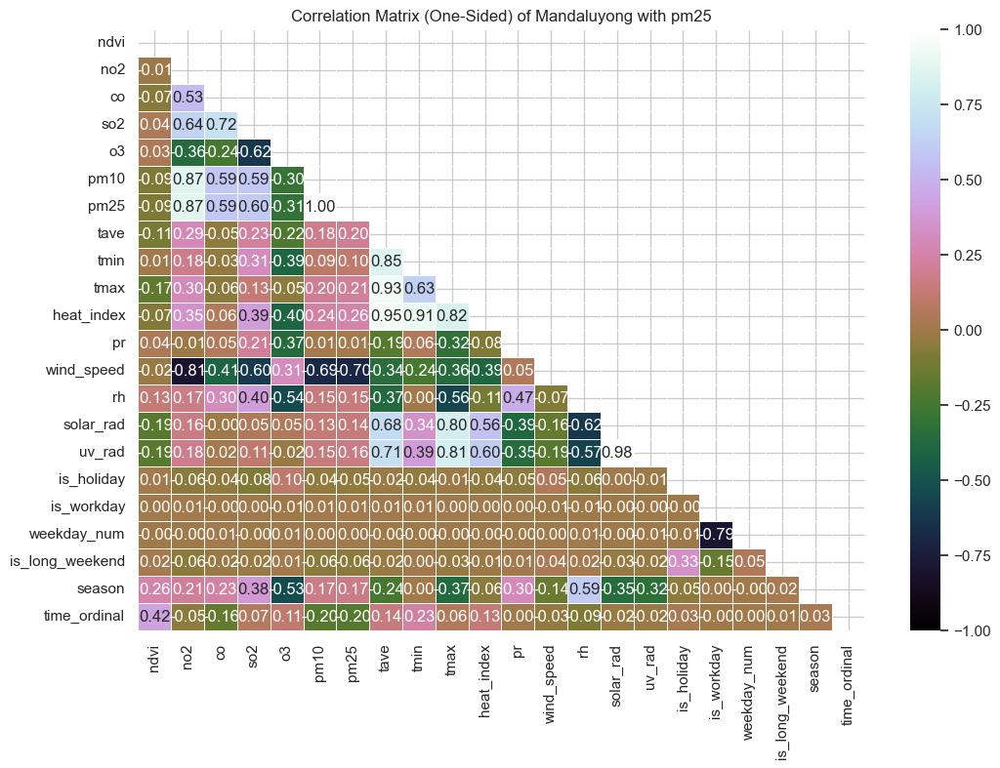

In [204]:
# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(12, 8))

# Draw the heatmap with the mask
sns.heatmap(corr_matrix, mask=mask, annot=True, fmt=".2f", cmap='cubehelix', vmin=-1, vmax=1, linewidths=.5)

# Set the title
plt.title('Correlation Matrix (One-Sided) of Mandaluyong with pm25')

# Display the heatmap
plt.show()

In [205]:
#select is_workday and remove weekday_num for multicollinearity prevention
#remove uv_rad and use solar_rad
#remove tave and tmax - retain tmin

(                                date          no2           co          so2  \
 count                           7305  7305.000000  7305.000000  7305.000000   
 mean   2012-12-31 00:00:00.000000256     5.691826     0.153309     3.684965   
 min              2003-01-01 00:00:00     1.030000     0.089100     0.970000   
 25%              2008-01-01 00:00:00     3.920000     0.131100     2.320000   
 50%              2012-12-31 00:00:00     5.900000     0.146500     3.070000   
 75%              2017-12-31 00:00:00     7.310000     0.167000     4.870000   
 max              2022-12-31 00:00:00    14.190000     0.386400    10.790000   
 std                              NaN     2.227905     0.032652     1.735508   
 
                 o3         pm10         pm25  
 count  7305.000000  7305.000000  7305.000000  
 mean     34.328453    54.501498    38.089218  
 min      24.470000    13.470000     9.130000  
 25%      28.460000    37.530000    25.820000  
 50%      34.270000    51.370000    35

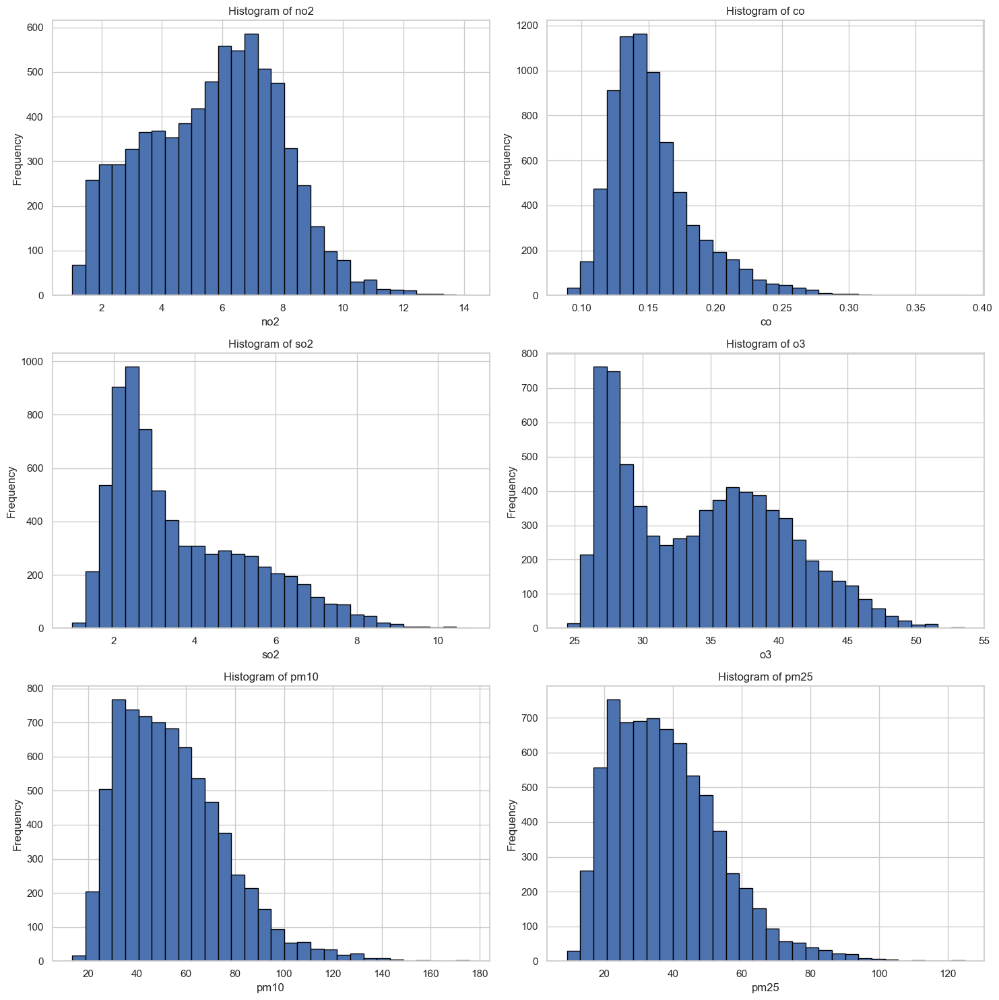

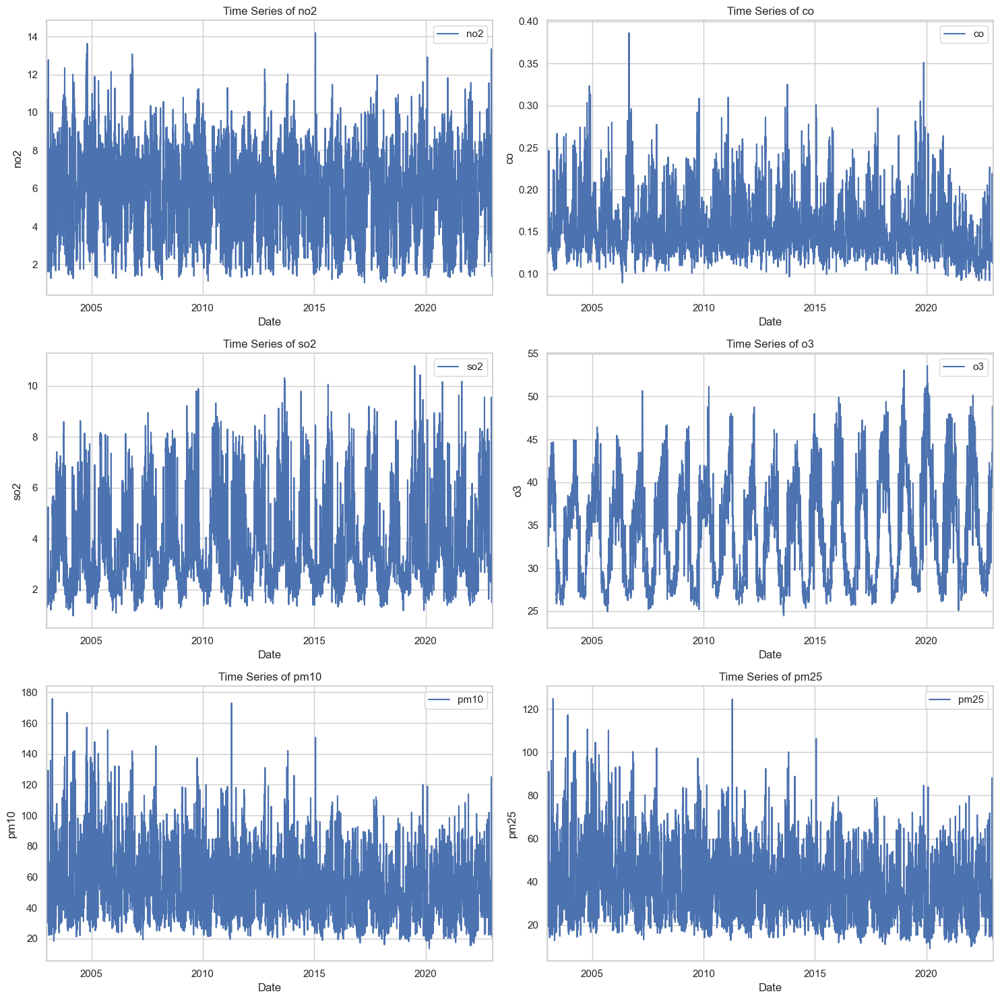

In [206]:
for col in pollutant_columns:
    mandaluyong_mean_pollutants_per_day[col] = pd.to_numeric(mandaluyong_mean_pollutants_per_day[col], errors='coerce')

# Summary statistics
summary_stats = mandaluyong_mean_pollutants_per_day.describe()

# Check for missing values
missing_values = mandaluyong_mean_pollutants_per_day.isnull().sum()

# Plotting histograms for each pollutant
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()
for i, col in enumerate(pollutant_columns):
    mandaluyong_mean_pollutants_per_day[col].hist(ax=axes[i], bins=30, edgecolor='black')
    axes[i].set_title(f'Histogram of {col.strip()}')
    axes[i].set_xlabel(col.strip())
    axes[i].set_ylabel('Frequency')

plt.tight_layout()

# Time series plot for each pollutant
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
axes = axes.flatten()
for i, col in enumerate(pollutant_columns):
    mandaluyong_mean_pollutants_per_day.plot(x='date', y=col, ax=axes[i])
    axes[i].set_title(f'Time Series of {col.strip()}')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel(col.strip())

plt.tight_layout()




# Display summary statistics and missing values
summary_stats, missing_values

In [207]:
pollutant_columns

['no2', 'co', 'so2', 'o3', 'pm10', 'pm25']

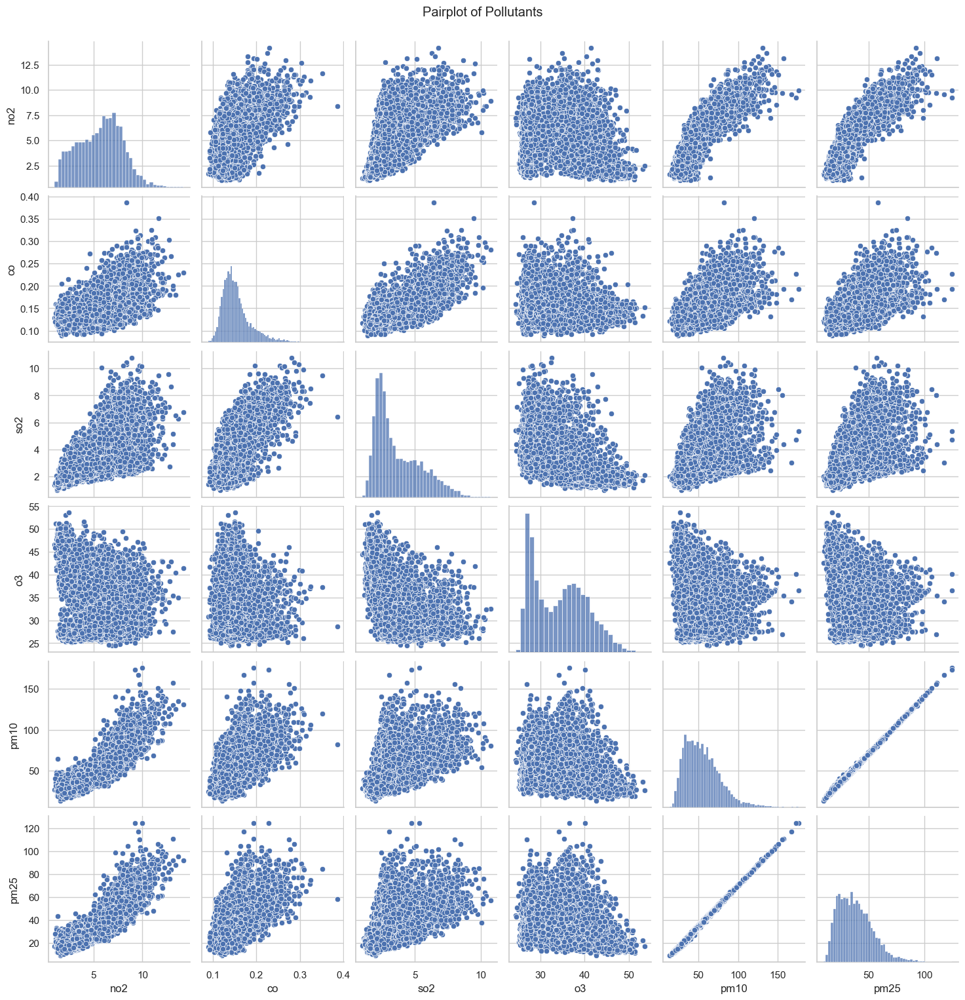

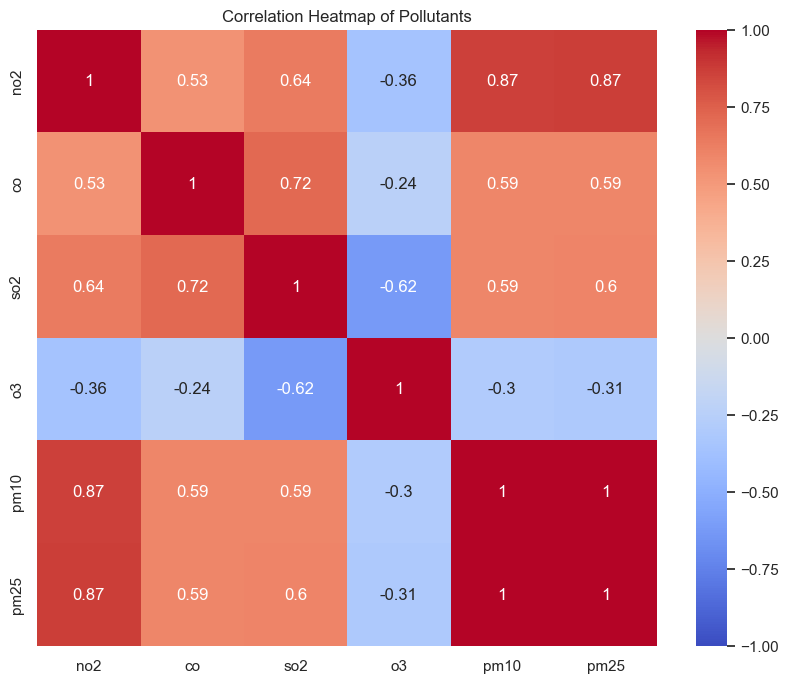

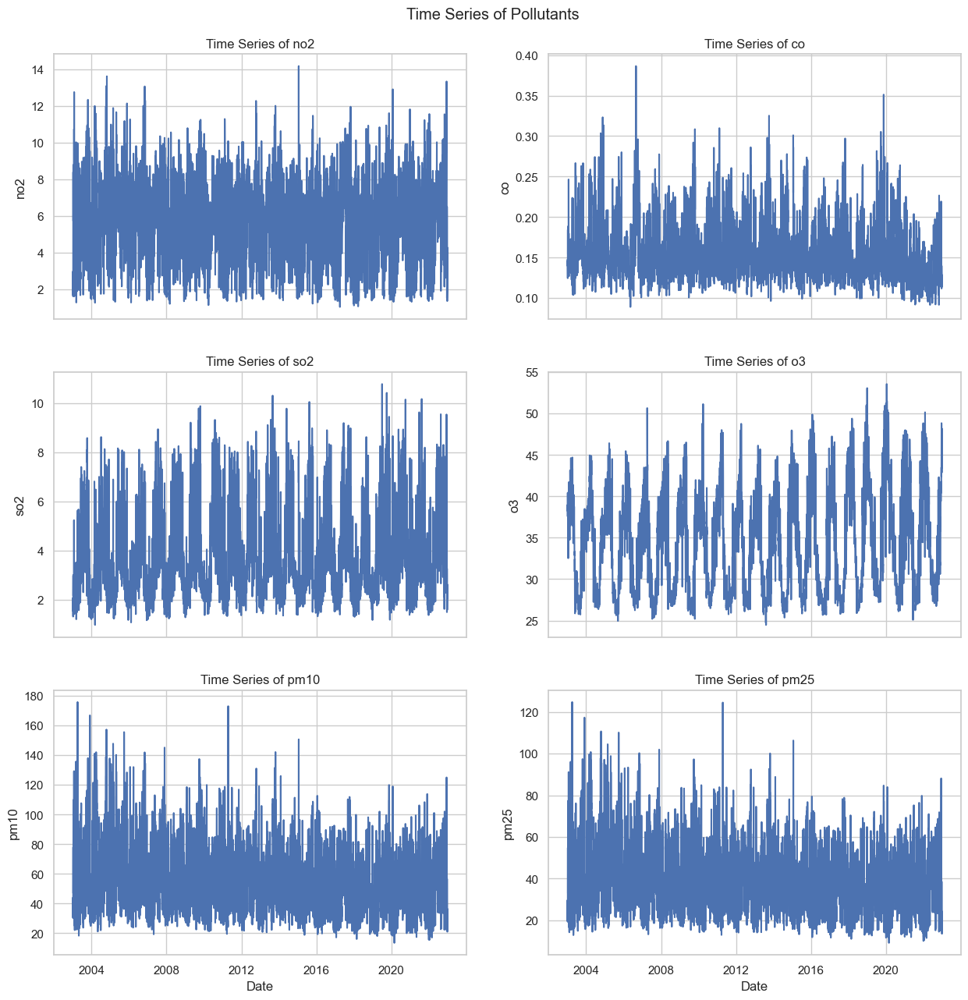

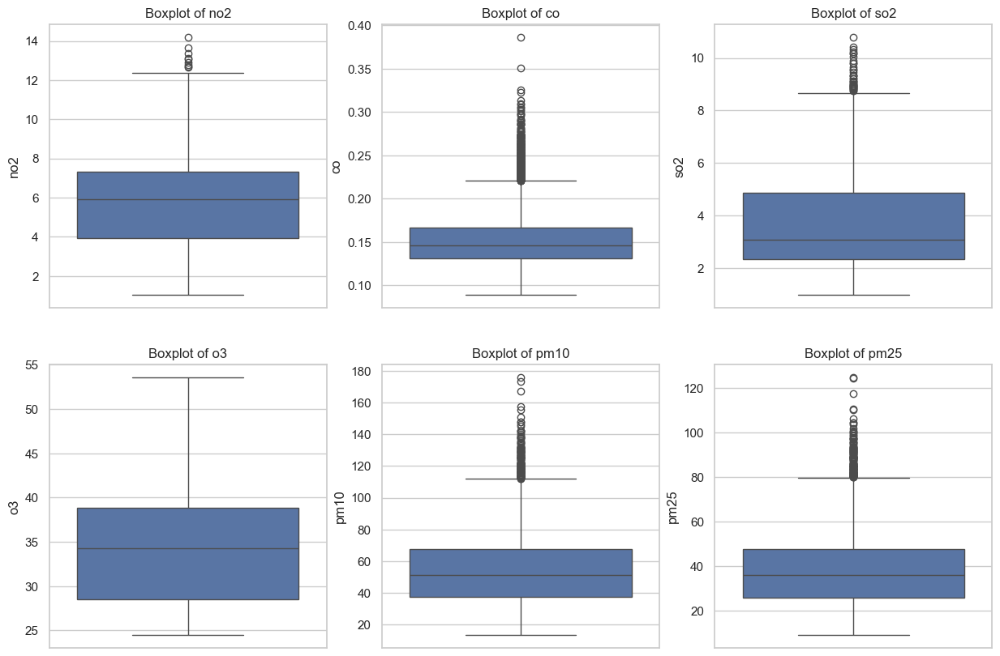

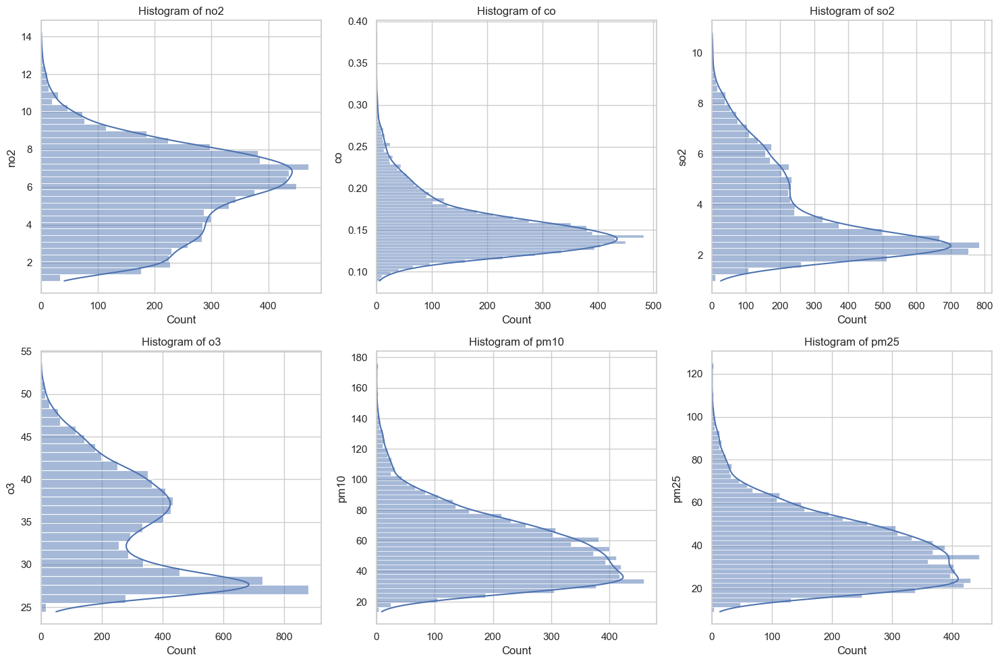

In [208]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of the visualization
sns.set(style="whitegrid")

# Create a pairplot to visualize relationships between variables
sns.pairplot(mandaluyong_mean_pollutants_per_day[pollutant_columns])
plt.suptitle('Pairplot of Pollutants', y=1.02)


# Create a heatmap to visualize correlations between variables
plt.figure(figsize=(10, 8))
correlation_matrix = mandaluyong_mean_pollutants_per_day[pollutant_columns].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Pollutants')

# Create time series plots for each pollutant
fig, axes = plt.subplots(3, 2, figsize=(15, 15), sharex=True)
fig.suptitle('Time Series of Pollutants', y=0.92)

# pollutants = ["pm25", "pm10", "o3", "no2", "so2", "co"]
for i, pollutant in enumerate(pollutant_columns):
    ax = axes[i//2, i%2]
    sns.lineplot(data=mandaluyong_mean_pollutants_per_day, x="date", y=pollutant, ax=ax)
    ax.set_title(f'Time Series of {pollutant.strip()}')
    ax.set_xlabel('Date')
    ax.set_ylabel(pollutant.strip())


# Create boxplots to visualize the distribution of each pollutant
plt.figure(figsize=(15, 10))
for i, column in enumerate(pollutant_columns, 1):
    plt.subplot(2, 3, i)
    sns.boxplot(y= mandaluyong_mean_pollutants_per_day[column])
    plt.title(f'Boxplot of {column.strip()}')

# Create histograms to visualize the distribution of each pollutant
plt.figure(figsize=(15, 10))
for i, column in enumerate(pollutant_columns, 1):
    plt.subplot(2, 3, i)
    sns.histplot(y= mandaluyong_mean_pollutants_per_day[column], kde=True)
    plt.title(f'Histogram of {column.strip()}')

# Show all plots
plt.tight_layout()
plt.show()

In [209]:
mandaluyong_combined_df

,date,ndvi,no2,co,so2,o3,pm10,pm25,tave,tmin,...,pr,wind_speed,rh,solar_rad,uv_rad,is_holiday,is_workday,weekday_num,is_long_weekend,season
0,2003-01-01,0.255185,2.09,0.1475,1.55,37.62,35.102,22.284,27.40,25.33,...,0.000000,5.03,71.26,199.32,23.89,1,1,3,0,1
1,2003-01-02,0.255185,1.70,0.1399,1.61,38.97,35.360,22.390,26.39,24.69,...,0.000000,6.13,70.34,214.67,24.67,0,1,4,0,1
2,2003-01-03,0.255185,2.97,0.1459,2.07,38.45,44.010,29.680,26.54,24.08,...,0.000000,3.70,66.81,221.31,24.98,0,1,5,0,1
3,2003-01-04,0.245185,2.05,0.1396,1.77,38.23,30.290,19.560,26.52,24.38,...,0.000000,5.93,69.28,205.95,24.69,0,0,6,0,1
4,2003-01-05,0.245185,1.66,0.1426,1.44,39.54,37.430,22.900,25.85,24.09,...,5.718148,6.20,74.02,197.95,23.13,0,0,7,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,2022-12-27,0.234074,1.78,0.1204,2.15,47.40,20.990,13.500,25.07,23.91,...,0.000000,3.40,71.59,104.90,13.83,0,1,2,0,1
7301,2022-12-28,0.234074,2.00,0.1217,2.07,45.52,23.120,14.710,25.94,23.71,...,0.000000,2.86,72.43,130.54,15.35,0,1,3,0,1
7302,2022-12-29,0.234074,3.29,0.1237,2.09,44.61,36.360,24.200,25.69,24.55,...,0.000000,1.44,75.32,62.90,7.54,0,1,4,0,1
7303,2022-12-30,0.234074,4.27,0.1285,2.42,44.15,31.800,22.070,26.91,25.10,...,0.000000,1.34,75.16,128.09,15.93,1,1,5,0,1


# Train Test Split

In [210]:
def split_data(data, train_size=0.7, validate_size=0.15, test_size=0.15):
    """
    Splits the data into train, validate, and test sets based on the given percentages.
    Ensures that the splits are mutually exclusive and checks the time horizon of each set.

    Parameters:
    - data (pd.DataFrame): The input dataframe with a 'Time_stamp' column.
    - train_size (float): The proportion of the data to include in the train set.
    - validate_size (float): The proportion of the data to include in the validate set.
    - test_size (float): The proportion of the data to include in the test set.

    Returns:
    - train_data (pd.DataFrame): The training set.
    - validate_data (pd.DataFrame): The validation set.
    - test_data (pd.DataFrame): The test set.
    - time_horizons (dict): The time horizons of each set.
    """
    assert train_size + validate_size + test_size == 1, "The sum of train, validate, and test sizes must be 1."

    # Sort data by 'Time_stamp'
    data = data.sort_values(by='date').reset_index(drop=True)

    # Calculate the number of samples for each set
    n = len(data)
    train_end = int(train_size * n)
    validate_end = train_end + int(validate_size * n)

    # Split the data
    train_data = data.iloc[:train_end]
    validate_data = data.iloc[train_end:validate_end]
    test_data = data.iloc[validate_end:]

    # Calculate time horizons
    time_horizons = {
        'train': train_data['date'].max() - train_data['date'].min(),
        'validate': validate_data['date'].max() - validate_data['date'].min(),
        'test': test_data['date'].max() - test_data['date'].min()
    }

    return train_data, validate_data, test_data, time_horizons


In [211]:
# Split the data
train_data, validate_data, test_data, time_horizons = split_data(mandaluyong_combined_df)

In [212]:
time_horizons

{'train': Timedelta('5112 days 00:00:00'),
 'validate': Timedelta('1094 days 00:00:00'),
 'test': Timedelta('1096 days 00:00:00')}

In [213]:
# Assuming train_data, validate_data, and test_data are already defined in the environment

# Extracting the time ranges for each dataset
train_time_range = (train_data['date'].min(), train_data['date'].max())
validate_time_range = (validate_data['date'].min(), validate_data['date'].max())
test_time_range = (test_data['date'].min(), test_data['date'].max())

# Function to check overlap between two time ranges
def check_overlap(range1, range2):
    """
    Check if two time ranges overlap.

    Mathematically, two ranges [a1, b1] and [a2, b2] overlap if:
    max(a1, a2) <= min(b1, b2)

    Parameters:
    range1 (tuple): The first time range as (start, end)
    range2 (tuple): The second time range as (start, end)

    Returns:
    bool: True if the ranges overlap, False otherwise
    """
    return max(range1[0], range2[0]) <= min(range1[1], range2[1])

# Checking overlaps
train_validate_overlap = check_overlap(train_time_range, validate_time_range)
train_test_overlap = check_overlap(train_time_range, test_time_range)
validate_test_overlap = check_overlap(validate_time_range, test_time_range)

train_validate_overlap, train_test_overlap, validate_test_overlap

(False, False, False)

In [214]:
import plotly.express as px

fig_train = px.line(train_data, x='date', y='pm25', title='Train Data: PM 2.5 over Time')
fig_train.show()

fig_validate = px.line(validate_data, x='date', y='pm25', title='Validate Data: PM 2.5 over Time')
fig_validate.show()

fig_test = px.line(test_data, x='date', y='pm25', title='Test Data: PM 2.5 over Time')
fig_test.show()

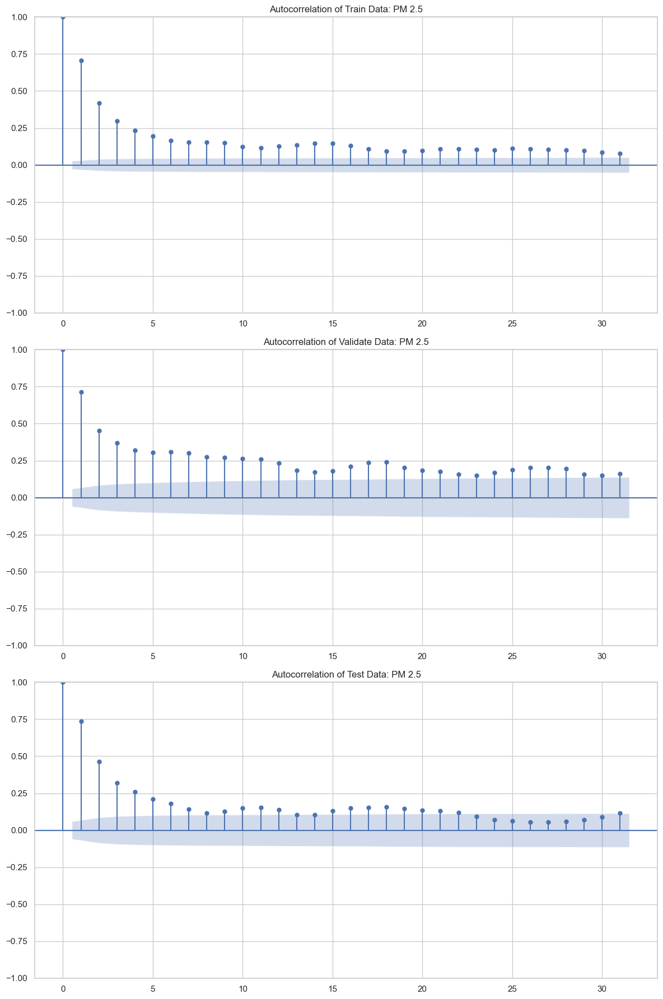

In [215]:
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf

# Set up the figure and axes
fig, axes = plt.subplots(3, 1, figsize=(12, 18))

# Plot autocorrelation for train data
plot_acf(train_data['pm25'], ax=axes[0], lags=31)
axes[0].set_title('Autocorrelation of Train Data: PM 2.5')

# Plot autocorrelation for validate data
plot_acf(validate_data['pm25'], ax=axes[1], lags=31)
axes[1].set_title('Autocorrelation of Validate Data: PM 2.5')

# Plot autocorrelation for test data
plot_acf(test_data['pm25'], ax=axes[2], lags=31)
axes[2].set_title('Autocorrelation of Test Data: PM 2.5')

# Adjust layout
plt.tight_layout()
plt.show()

In [216]:
train_data

,date,ndvi,no2,co,so2,o3,pm10,pm25,tave,tmin,...,pr,wind_speed,rh,solar_rad,uv_rad,is_holiday,is_workday,weekday_num,is_long_weekend,season
0,2003-01-01,0.255185,2.09,0.1475,1.55,37.62,35.102,22.284,27.40,25.33,...,0.000000,5.03,71.26,199.32,23.89,1,1,3,0,1
1,2003-01-02,0.255185,1.70,0.1399,1.61,38.97,35.360,22.390,26.39,24.69,...,0.000000,6.13,70.34,214.67,24.67,0,1,4,0,1
2,2003-01-03,0.255185,2.97,0.1459,2.07,38.45,44.010,29.680,26.54,24.08,...,0.000000,3.70,66.81,221.31,24.98,0,1,5,0,1
3,2003-01-04,0.245185,2.05,0.1396,1.77,38.23,30.290,19.560,26.52,24.38,...,0.000000,5.93,69.28,205.95,24.69,0,0,6,0,1
4,2003-01-05,0.245185,1.66,0.1426,1.44,39.54,37.430,22.900,25.85,24.09,...,5.718148,6.20,74.02,197.95,23.13,0,0,7,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5108,2016-12-26,0.253333,3.82,0.1282,2.08,38.92,37.570,25.820,26.10,24.35,...,34.521481,4.03,81.81,63.17,9.19,1,1,1,1,1
5109,2016-12-27,0.245185,8.44,0.1579,3.87,35.67,69.050,48.550,27.90,25.60,...,0.000000,2.28,82.65,166.25,20.73,0,1,2,0,1
5110,2016-12-28,0.245185,7.88,0.1546,3.20,29.90,66.310,46.520,28.08,26.04,...,0.000000,2.46,80.53,177.76,23.67,0,1,3,0,1
5111,2016-12-29,0.245185,6.04,0.1509,3.01,38.23,49.910,34.770,27.98,26.05,...,0.000000,2.75,77.24,181.07,20.67,0,1,4,0,1


# Two-layer stacked LSTM

In [217]:
# from keras_tuner import RandomSearch
# from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
# from tensorflow.keras.optimizers import Adam
# from sklearn.preprocessing import MinMaxScaler
# from tensorflow.keras.layers import LSTM, Dropout, Dense, Input
# from tensorflow.keras.models import Sequential
# import numpy as np
# import pandas as pd
# from lime import lime_tabular

# def prepare_data(data, predictors, target, time_steps=1):
#     X, y = [], []
#     for i in range(len(data) - time_steps):
#         X.append(data[predictors].iloc[i:(i + time_steps)].values)
#         y.append(data[target].iloc[i + time_steps])
#     return np.array(X), np.array(y)

# def build_model(hp, time_steps, predictors):
#     units_choices = [32, 64, 128, 256, 512]
#     model = Sequential()
#     model.add(Input(shape=(time_steps, len(predictors))))
#     model.add(LSTM(units=hp.Choice('units_layer1', values=units_choices), return_sequences=True))
#     model.add(Dropout(rate=hp.Float('dropout_rate1', min_value=0.1, max_value=0.3, step=0.1)))
#     model.add(LSTM(units=hp.Choice('units_layer2', values=units_choices)))
#     model.add(Dropout(rate=hp.Float('dropout_rate2', min_value=0.1, max_value=0.3, step=0.1)))
#     model.add(Dense(1))

#     model.compile(optimizer=Adam(hp.Float('learning_rate', min_value=1e-4, max_value=1e-2, sampling='LOG')),
#                   loss='mean_absolute_error')
#     return model

# def build_and_train_lstm_with_tuning(train_data, validate_data, test_data, predictors, target, time_steps=1, max_trials=10, epochs=100, batch_size=256):
#     # Scale data
#     scaler = MinMaxScaler()
#     train_data_scaled = scaler.fit_transform(train_data[predictors + [target]])
#     validate_data_scaled = scaler.transform(validate_data[predictors + [target]])
#     test_data_scaled = scaler.transform(test_data[predictors + [target]])

#     train_data_scaled = pd.DataFrame(train_data_scaled, columns=predictors + [target])
#     validate_data_scaled = pd.DataFrame(validate_data_scaled, columns=predictors + [target])
#     test_data_scaled = pd.DataFrame(test_data_scaled, columns=predictors + [target])

#     # Prepare time-series data
#     X_train, y_train = prepare_data(train_data_scaled, predictors, target, time_steps)
#     X_validate, y_validate = prepare_data(validate_data_scaled, predictors, target, time_steps)
#     X_test, y_test = prepare_data(test_data_scaled, predictors, target, time_steps)

#     # Hyperparameter tuning
#     tuner = RandomSearch(
#         lambda hp: build_model(hp, time_steps, predictors),
#         objective='val_loss',
#         max_trials=max_trials,
#         directory='hyperparam_tuning',
#         project_name='lstm_tuning'
#     )

#     # Early stopping
#     early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

#     # Learning rate scheduler
#     lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

#     # Run hyperparameter search
#     tuner.search(X_train, y_train, epochs=epochs, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler], batch_size=batch_size)
    
#     # Retrieve the best hyperparameters
#     best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

#     # Get the optimal model
#     model = tuner.get_best_models(num_models=1)[0]

#     # Recompile model to reset optimizer state
#     learning_rate = best_hps.get('learning_rate')  # Correctly accessing the learning rate
#     model.compile(optimizer=Adam(learning_rate), loss='mean_absolute_error')

#     # Train the model on the full dataset
#     history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler])

#     # Generate predictions
#     train_predictions = model.predict(X_train)
#     validate_predictions = model.predict(X_validate)
#     test_predictions = model.predict(X_test)

#     # Inverse scale predictions
#     train_predictions = scaler.inverse_transform(np.concatenate((train_data_scaled[predictors].iloc[time_steps:].values, train_predictions), axis=1))[:, -1]
#     validate_predictions = scaler.inverse_transform(np.concatenate((validate_data_scaled[predictors].iloc[time_steps:].values, validate_predictions), axis=1))[:, -1]
#     test_predictions = scaler.inverse_transform(np.concatenate((test_data_scaled[predictors].iloc[time_steps:].values, test_predictions), axis=1))[:, -1]

#     # LIME explanation
#     X_train_flat = X_train.reshape((X_train.shape[0], X_train.shape[1] * X_train.shape[2]))
#     explainer = lime_tabular.LimeTabularExplainer(
#         X_train_flat,
#         feature_names=predictors * time_steps,
#         class_names=[target],
#         mode="regression"
#     )

#     def lime_predict(instance):
#         reshaped_instance = instance.reshape((instance.shape[0], time_steps, len(predictors)))
#         return model.predict(reshaped_instance)

#     instance_to_explain = X_test[0].reshape(1, -1)
#     explanation = explainer.explain_instance(instance_to_explain.flatten(), lime_predict)

#     explanation.show_in_notebook()

#     return model, history, train_predictions, validate_predictions, test_predictions, best_hps

# # Plot results
# def plot_results(history, test_data, test_predictions, target, time_steps):
#     plt.figure(figsize=(12, 6))
#     plt.plot(history.history['loss'], label='Training Loss')
#     plt.plot(history.history['val_loss'], label='Validation Loss')
#     plt.title('Learning Curves')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.legend()
#     plt.show()

#     plt.figure(figsize=(12, 6))
#     plt.plot(test_data['date'].iloc[time_steps:], test_data[target].iloc[time_steps:], label='Actual PM 2.5')
#     plt.plot(test_data['date'].iloc[time_steps:], test_predictions, label='Predicted PM 2.5')
#     plt.title('Actual vs Predicted PM 2.5 on Test Data')
#     plt.xlabel('Time')
#     plt.ylabel('PM 2.5')
#     plt.legend()
#     plt.show()

#     plt.figure(figsize=(10, 6))
#     plt.scatter(test_data[target].iloc[time_steps:], test_predictions, alpha=0.5)
#     plt.title('Scatter Plot of Predicted vs. Actual PM 2.5 on Test Data')
#     plt.xlabel('Actual PM 2.5')
#     plt.ylabel('Predicted PM 2.5')
#     plt.plot([test_data[target].min(), test_data[target].max()], [test_data[target].min(), test_data[target].max()], 'k--', lw=2)

#     mse = mean_squared_error(test_data[target].iloc[time_steps:], test_predictions)
#     mae = mean_absolute_error(test_data[target].iloc[time_steps:], test_predictions)
#     r2 = r2_score(test_data[target].iloc[time_steps:], test_predictions)

#     plt.text(0.05, 0.95, f'MSE: {mse:.2f}\nMAE: {mae:.2f}\nR^2: {r2:.2f}', transform=plt.gca().transAxes, fontsize=12,
#              verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

#     plt.show()

# # Define predictors and target
# predictors = [
#     'ndvi', 'tave', 'tmin', 'tmax', 'heat_index', 'pr', 'wind_speed', 'rh', 'solar_rad', 
#     'uv_rad', 'is_holiday', 'is_workday', 'weekday_num', 'is_long_weekend', 'season'
# ]
# target = 'pm25'

# # Build and train the model with hyperparameter tuning
# model, history, train_predictions, validate_predictions, test_predictions, best_hps = build_and_train_lstm_with_tuning(train_data, validate_data, test_data, predictors, target, time_steps=30)

# # Plot the results
# plot_results(history, test_data, test_predictions, target, time_steps=30)

In [218]:
# # Print the best parameters
# print("Best hyperparameters:")
# print(f"Units Layer 1: {best_hps.get('units_layer1')}")
# print(f"Dropout Rate Layer 1: {best_hps.get('dropout_rate1')}")
# print(f"Units Layer 2: {best_hps.get('units_layer2')}")
# print(f"Dropout Rate Layer 2: {best_hps.get('dropout_rate2')}")
# print(f"Learning Rate: {best_hps.get('learning_rate')}")

# Three-Layer stacked LSTM

Trial 10 Complete [00h 03m 30s]
val_loss: 0.06722554564476013

Best val_loss So Far: 0.06581547856330872
Total elapsed time: 00h 19m 21s
Epoch 1/100


c:\Users\fritz\anaconda3\envs\csc700m_tf_gpu\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 24 variables. 



20/20 ━━━━━━━━━━━━━━━━━━━━ 5s 113ms/step - loss: 0.0802 - val_loss: 0.0664 - learning_rate: 0.0010
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.0795 - val_loss: 0.0664 - learning_rate: 0.0010
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 100ms/step - loss: 0.0756 - val_loss: 0.0670 - learning_rate: 0.0010
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.0780 - val_loss: 0.0673 - learning_rate: 0.0010
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.0789 - val_loss: 0.0669 - learning_rate: 0.0010
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0773 - val_loss: 0.0658 - learning_rate: 0.0010
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.0773 - val_loss: 0.0661 - learning_rate: 0.0010
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - loss: 0.0779 - val_loss: 0.0670 - learning_rate: 0.0010
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 98ms/step - loss: 0.0779 - val_loss: 0.0666 - learning_rate: 0.0010
Epoch 10/100
20/20 ━

Training completed in 1206.74 seconds (20.11 minutes).


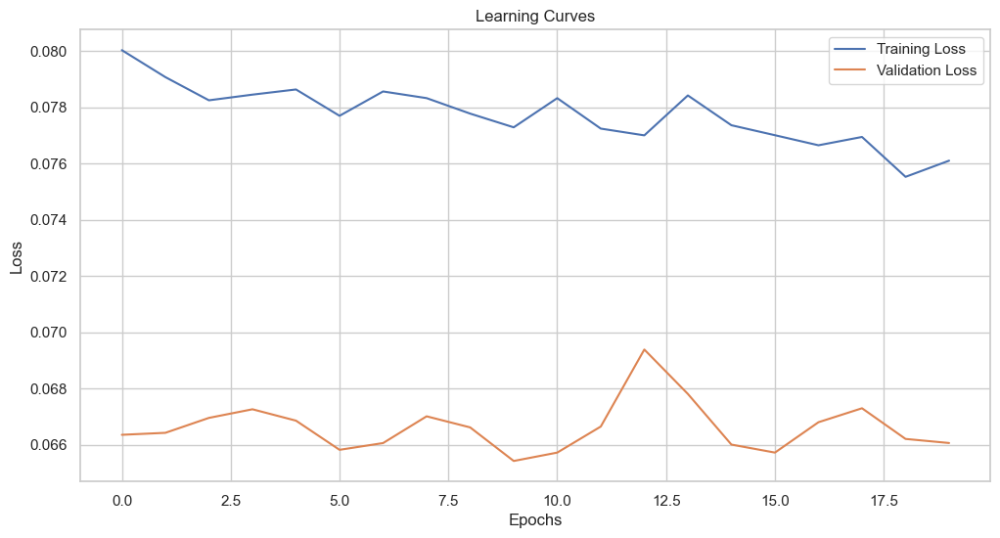

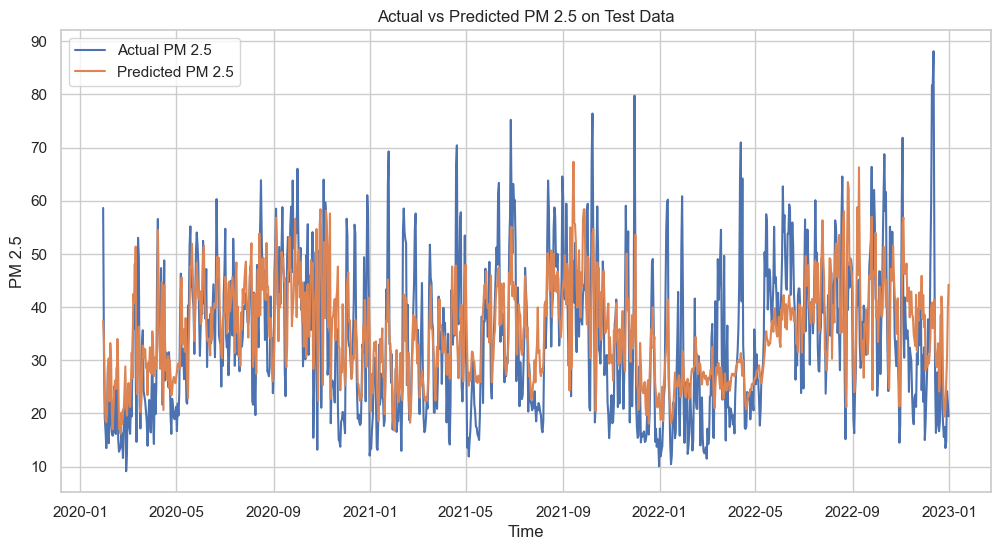

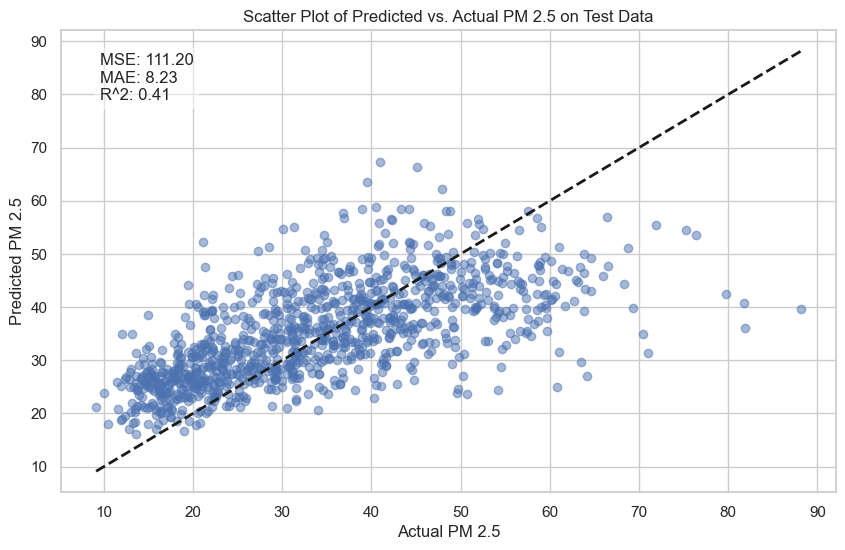

In [226]:
from keras_tuner import RandomSearch
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam, AdamW
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.layers import LSTM, Dropout, Dense, Input, Bidirectional, Attention
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
from lime import lime_tabular

def prepare_data(data, predictors, target, time_steps=1):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[predictors].iloc[i:(i + time_steps)].values)
        y.append(data[target].iloc[i + time_steps])
    return np.array(X), np.array(y)

def build_model(hp, time_steps, predictors):
    units_choices = [16, 32, 64]
    model = Sequential()
    model.add(Input(shape=(time_steps, len(predictors))))
    model.add(LSTM(units=hp.Choice('units_layer1', values=units_choices), return_sequences=True))
    model.add(Dropout(rate=hp.Float('dropout_rate1', min_value=0.1, max_value=0.2, step=0.1)))
    model.add(LSTM(units=hp.Choice('units_layer2', values=units_choices), return_sequences=True))
    model.add(Dropout(rate=hp.Float('dropout_rate2', min_value=0.1, max_value=0.2, step=0.1)))
    model.add(LSTM(units=hp.Choice('units_layer3', values=units_choices)))
    model.add(Dropout(rate=hp.Float('dropout_rate3', min_value=0.1, max_value=0.2, step=0.1)))
    model.add(Dense(1))

    model.compile(optimizer=Adam(hp.Choice('learning_rate', values=[0.01, 0.001])),
              loss='mean_absolute_error')
    return model

def build_and_train_lstm_with_tuning(train_data, validate_data, test_data, predictors, target, time_steps=1, max_trials=10, epochs=100, batch_size=256):
    # Scale data
    scaler = MinMaxScaler()
    train_data_scaled = scaler.fit_transform(train_data[predictors + [target]])
    validate_data_scaled = scaler.transform(validate_data[predictors + [target]])
    test_data_scaled = scaler.transform(test_data[predictors + [target]])

    train_data_scaled = pd.DataFrame(train_data_scaled, columns=predictors + [target])
    validate_data_scaled = pd.DataFrame(validate_data_scaled, columns=predictors + [target])
    test_data_scaled = pd.DataFrame(test_data_scaled, columns=predictors + [target])

    # Prepare time-series data
    X_train, y_train = prepare_data(train_data_scaled, predictors, target, time_steps)
    X_validate, y_validate = prepare_data(validate_data_scaled, predictors, target, time_steps)
    X_test, y_test = prepare_data(test_data_scaled, predictors, target, time_steps)

    # Hyperparameter tuning
    tuner = RandomSearch(
        lambda hp: build_model(hp, time_steps, predictors),
        objective='val_loss',
        max_trials=max_trials,
        directory='3hyperparam_tuning',
        project_name='3lstm_tuning'
    )

    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, min_delta=1e-4)

    # Learning rate scheduler
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, verbose=1, plateau_num_epochs=3)

    # Measure training start time
    start_time = time.time()

    # Run hyperparameter search
    tuner.search(X_train, y_train, epochs=epochs, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler], batch_size=batch_size)
    
    # Retrieve the best hyperparameters
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

    # Get the optimal model
    model = tuner.get_best_models(num_models=1)[0]

    # Recompile model to reset optimizer state
    learning_rate = best_hps.get('learning_rate')  # Correctly accessing the learning rate
    model.compile(optimizer=Adam(learning_rate), loss='mean_absolute_error')

    # Train the model on the full dataset
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler])

    # Measure training end time and calculate duration
    end_time = time.time()
    training_duration = end_time - start_time
    print(f"Total training time: {training_duration:.2f} seconds ({training_duration / 60:.2f} minutes)")

    # Generate predictions
    train_predictions = model.predict(X_train)
    validate_predictions = model.predict(X_validate)
    test_predictions = model.predict(X_test)

    # Inverse scale predictions
    train_predictions = scaler.inverse_transform(np.concatenate((train_data_scaled[predictors].iloc[time_steps:].values, train_predictions), axis=1))[:, -1]
    validate_predictions = scaler.inverse_transform(np.concatenate((validate_data_scaled[predictors].iloc[time_steps:].values, validate_predictions), axis=1))[:, -1]
    test_predictions = scaler.inverse_transform(np.concatenate((test_data_scaled[predictors].iloc[time_steps:].values, test_predictions), axis=1))[:, -1]

    # LIME explanation
    X_train_flat = X_train.reshape((X_train.shape[0], X_train.shape[1] * X_train.shape[2]))
    explainer = lime_tabular.LimeTabularExplainer(
        X_train_flat,
        feature_names=predictors * time_steps,
        class_names=[target],
        mode="regression"
    )

    def lime_predict(instance):
        reshaped_instance = instance.reshape((instance.shape[0], time_steps, len(predictors)))
        return model.predict(reshaped_instance)

    instance_to_explain = X_test[0].reshape(1, -1)
    explanation = explainer.explain_instance(instance_to_explain.flatten(), lime_predict)

    explanation.show_in_notebook()

    return model, history, train_predictions, validate_predictions, test_predictions, best_hps, training_duration

# Plot results
def plot_results(history, test_data, test_predictions, target, time_steps):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Learning Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(test_data['date'].iloc[time_steps:], test_data[target].iloc[time_steps:], label='Actual PM 2.5')
    plt.plot(test_data['date'].iloc[time_steps:], test_predictions, label='Predicted PM 2.5')
    plt.title('Actual vs Predicted PM 2.5 on Test Data')
    plt.xlabel('Time')
    plt.ylabel('PM 2.5')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.scatter(test_data[target].iloc[time_steps:], test_predictions, alpha=0.5)
    plt.title('Scatter Plot of Predicted vs. Actual PM 2.5 on Test Data')
    plt.xlabel('Actual PM 2.5')
    plt.ylabel('Predicted PM 2.5')
    plt.plot([test_data[target].min(), test_data[target].max()], [test_data[target].min(), test_data[target].max()], 'k--', lw=2)

    mse = mean_squared_error(test_data[target].iloc[time_steps:], test_predictions)
    mae = mean_absolute_error(test_data[target].iloc[time_steps:], test_predictions)
    r2 = r2_score(test_data[target].iloc[time_steps:], test_predictions)

    plt.text(0.05, 0.95, f'MSE: {mse:.2f}\nMAE: {mae:.2f}\nR^2: {r2:.2f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.show()

# Define predictors and target
predictors = [
    'ndvi', 'tave', 'tmin', 'heat_index', 'pr', 'wind_speed', 'rh',  'is_holiday', 'is_workday', 'is_long_weekend', 'season' #remove for multicollinearity: 'solar_rad', 'uv_rad', 'tmax', 'weekday_num'
]
target = 'pm25'

# Build and train the model with hyperparameter tuning
model, history, train_predictions, validate_predictions, test_predictions, best_hps, training_duration = build_and_train_lstm_with_tuning(train_data, validate_data, test_data, predictors, target, time_steps=30)

# Display training time
print(f"Training completed in {training_duration:.2f} seconds ({training_duration / 60:.2f} minutes).")

# Plot the results
plot_results(history, test_data, test_predictions, target, time_steps=30)

In [227]:
# Print the best parameters
print("Best hyperparameters:")
print(f"Units Layer 1: {best_hps.get('units_layer1')}")
print(f"Dropout Rate Layer 1: {best_hps.get('dropout_rate1')}")
print(f"Units Layer 2: {best_hps.get('units_layer2')}")
print(f"Dropout Rate Layer 2: {best_hps.get('dropout_rate2')}")
print(f"Units Layer 3: {best_hps.get('units_layer3')}")
print(f"Dropout Rate Layer 3: {best_hps.get('dropout_rate3')}")
print(f"Learning Rate: {best_hps.get('learning_rate')}")

Best hyperparameters:
Units Layer 1: 64
Dropout Rate Layer 1: 0.2
Units Layer 2: 32
Dropout Rate Layer 2: 0.1
Units Layer 3: 16
Dropout Rate Layer 3: 0.1
Learning Rate: 0.001


# Three-Stacked GRU

Trial 10 Complete [00h 02m 59s]
val_loss: 0.06702674180269241

Best val_loss So Far: 0.06599844992160797
Total elapsed time: 00h 19m 27s
Epoch 1/100


c:\Users\fritz\anaconda3\envs\csc700m_tf_gpu\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 24 variables. 



20/20 ━━━━━━━━━━━━━━━━━━━━ 6s 183ms/step - loss: 0.1015 - val_loss: 0.0661 - learning_rate: 0.0100
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0813 - val_loss: 0.0690 - learning_rate: 0.0100
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0775 - val_loss: 0.0679 - learning_rate: 0.0100
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0787 - val_loss: 0.0655 - learning_rate: 0.0100
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0787 - val_loss: 0.0743 - learning_rate: 0.0100
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0769 - val_loss: 0.0700 - learning_rate: 0.0100
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0780 - val_loss: 0.0759 - learning_rate: 0.0100
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0763 - val_loss: 0.0683 - learning_rate: 0.0100
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0787 - val_loss: 0.0694 - learning_rate: 0.0100
Epoch 10/100


Training completed in 1216.12 seconds (20.27 minutes).


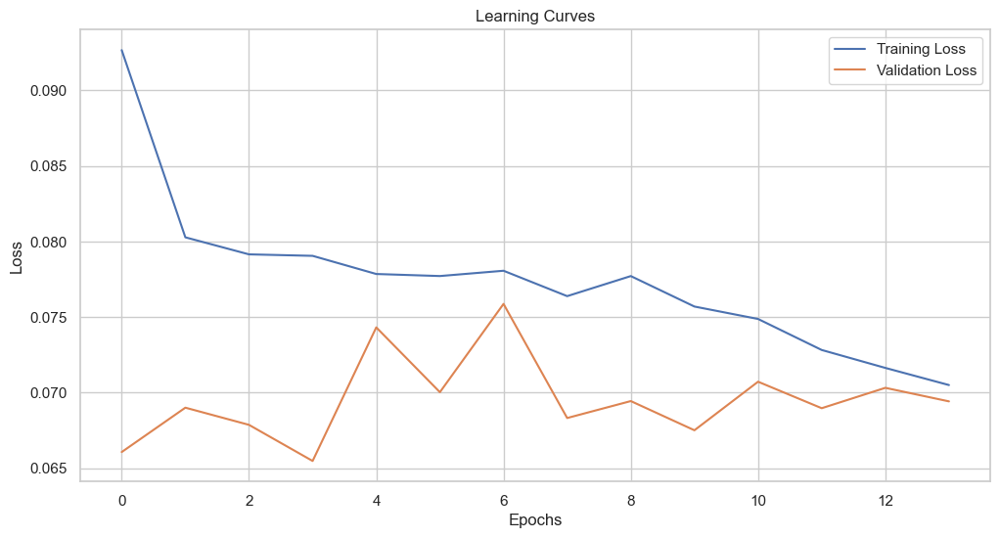

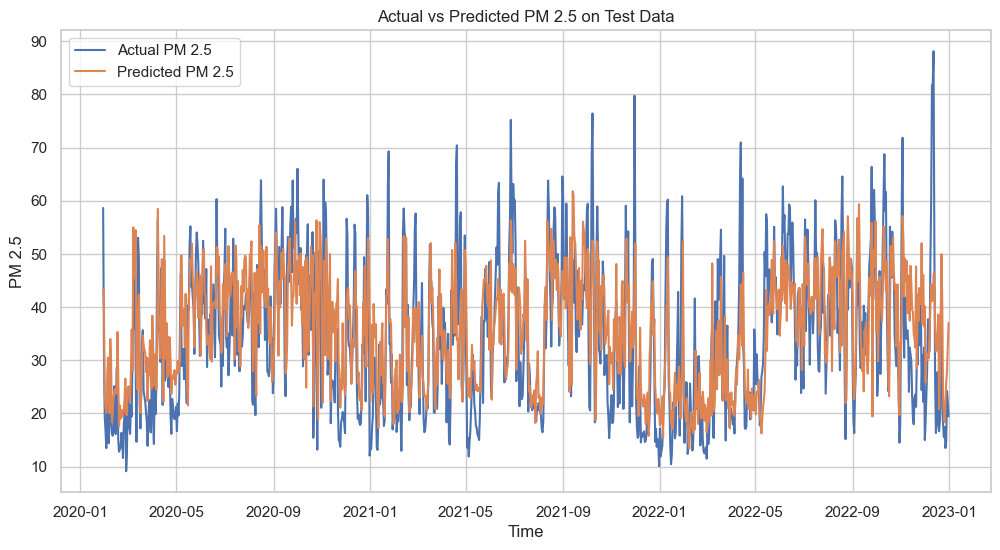

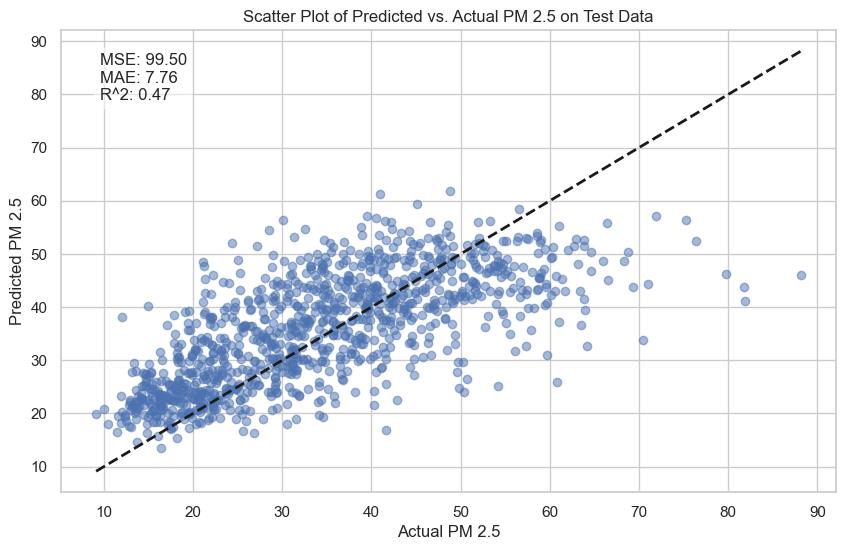

In [228]:
from keras_tuner import RandomSearch
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.layers import LSTM, Dropout, Dense, Input, GRU
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
from lime import lime_tabular

def prepare_data(data, predictors, target, time_steps=1):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[predictors].iloc[i:(i + time_steps)].values)
        y.append(data[target].iloc[i + time_steps])
    return np.array(X), np.array(y)

def build_gru_model(hp, time_steps, predictors):
    units_choices = [16, 32, 64]
    model = Sequential()
    model.add(Input(shape=(time_steps, len(predictors))))
    model.add(GRU(units=hp.Choice('units_layer1', values=units_choices), return_sequences=True))
    model.add(Dropout(rate=hp.Float('dropout_rate1', min_value=0.1, max_value=0.2, step=0.1)))
    model.add(GRU(units=hp.Choice('units_layer2', values=units_choices), return_sequences=True))
    model.add(Dropout(rate=hp.Float('dropout_rate2', min_value=0.1, max_value=0.2, step=0.1)))
    model.add(GRU(units=hp.Choice('units_layer3', values=units_choices)))
    model.add(Dropout(rate=hp.Float('dropout_rate3', min_value=0.1, max_value=0.2, step=0.1)))
    model.add(Dense(1))

    model.compile(optimizer=Adam(hp.Choice('learning_rate', values=[0.01, 0.001])),
              loss='mean_absolute_error')
    return model

def build_and_train_gru_with_tuning(train_data, validate_data, test_data, predictors, target, time_steps=1, max_trials=10, epochs=100, batch_size=256):
    # Scale data
    scaler = MinMaxScaler()
    train_data_scaled = scaler.fit_transform(train_data[predictors + [target]])
    validate_data_scaled = scaler.transform(validate_data[predictors + [target]])
    test_data_scaled = scaler.transform(test_data[predictors + [target]])

    train_data_scaled = pd.DataFrame(train_data_scaled, columns=predictors + [target])
    validate_data_scaled = pd.DataFrame(validate_data_scaled, columns=predictors + [target])
    test_data_scaled = pd.DataFrame(test_data_scaled, columns=predictors + [target])

    # Prepare time-series data
    X_train, y_train = prepare_data(train_data_scaled, predictors, target, time_steps)
    X_validate, y_validate = prepare_data(validate_data_scaled, predictors, target, time_steps)
    X_test, y_test = prepare_data(test_data_scaled, predictors, target, time_steps)

    # Hyperparameter tuning
    tuner = RandomSearch(
        lambda hp: build_gru_model(hp, time_steps, predictors),
        objective='val_loss',
        max_trials=max_trials,
        directory='3hyperparam_tuning',
        project_name='3gru_tuning'
    )

    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Learning rate scheduler
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, verbose=1, plateau_num_epochs=3)

    # Measure training start time
    start_time = time.time()

    # Run hyperparameter search
    tuner.search(X_train, y_train, epochs=epochs, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler], batch_size=batch_size)
    
    # Retrieve the best hyperparameters
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

    # Get the optimal model
    model = tuner.get_best_models(num_models=1)[0]

    # Recompile model to reset optimizer state
    learning_rate = best_hps.get('learning_rate')  # Correctly accessing the learning rate
    model.compile(optimizer=Adam(learning_rate), loss='mean_absolute_error')

    # Train the model on the full dataset
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler])

    # Measure training end time and calculate duration
    end_time = time.time()
    training_duration = end_time - start_time
    print(f"Total training time: {training_duration:.2f} seconds ({training_duration / 60:.2f} minutes)")

    # Generate predictions
    train_predictions = model.predict(X_train)
    validate_predictions = model.predict(X_validate)
    test_predictions = model.predict(X_test)

    # Inverse scale predictions
    train_predictions = scaler.inverse_transform(np.concatenate((train_data_scaled[predictors].iloc[time_steps:].values, train_predictions), axis=1))[:, -1]
    validate_predictions = scaler.inverse_transform(np.concatenate((validate_data_scaled[predictors].iloc[time_steps:].values, validate_predictions), axis=1))[:, -1]
    test_predictions = scaler.inverse_transform(np.concatenate((test_data_scaled[predictors].iloc[time_steps:].values, test_predictions), axis=1))[:, -1]

    # LIME explanation
    X_train_flat = X_train.reshape((X_train.shape[0], X_train.shape[1] * X_train.shape[2]))
    explainer = lime_tabular.LimeTabularExplainer(
        X_train_flat,
        feature_names=predictors * time_steps,
        class_names=[target],
        mode="regression"
    )

    def lime_predict(instance):
        reshaped_instance = instance.reshape((instance.shape[0], time_steps, len(predictors)))
        return model.predict(reshaped_instance)

    instance_to_explain = X_test[0].reshape(1, -1)
    explanation = explainer.explain_instance(instance_to_explain.flatten(), lime_predict)

    explanation.show_in_notebook()

    return model, history, train_predictions, validate_predictions, test_predictions, best_hps, training_duration

# Plot results
def plot_results(history, test_data, test_predictions, target, time_steps):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Learning Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(test_data['date'].iloc[time_steps:], test_data[target].iloc[time_steps:], label='Actual PM 2.5')
    plt.plot(test_data['date'].iloc[time_steps:], test_predictions, label='Predicted PM 2.5')
    plt.title('Actual vs Predicted PM 2.5 on Test Data')
    plt.xlabel('Time')
    plt.ylabel('PM 2.5')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.scatter(test_data[target].iloc[time_steps:], test_predictions, alpha=0.5)
    plt.title('Scatter Plot of Predicted vs. Actual PM 2.5 on Test Data')
    plt.xlabel('Actual PM 2.5')
    plt.ylabel('Predicted PM 2.5')
    plt.plot([test_data[target].min(), test_data[target].max()], [test_data[target].min(), test_data[target].max()], 'k--', lw=2)

    mse = mean_squared_error(test_data[target].iloc[time_steps:], test_predictions)
    mae = mean_absolute_error(test_data[target].iloc[time_steps:], test_predictions)
    r2 = r2_score(test_data[target].iloc[time_steps:], test_predictions)

    plt.text(0.05, 0.95, f'MSE: {mse:.2f}\nMAE: {mae:.2f}\nR^2: {r2:.2f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.show()

# Define predictors and target
predictors = [
    'ndvi', 'tave', 'tmin', 'heat_index', 'pr', 'wind_speed', 'rh',  'is_holiday', 'is_workday', 'is_long_weekend', 'season' #remove for multicollinearity: 'solar_rad', 'uv_rad', 'tmax', 'weekday_num'
]
target = 'pm25'

# Build and train the model with hyperparameter tuning
model, history, train_predictions, validate_predictions, test_predictions, best_hps, training_duration = build_and_train_gru_with_tuning(train_data, validate_data, test_data, predictors, target, time_steps=30)

# Display training time
print(f"Training completed in {training_duration:.2f} seconds ({training_duration / 60:.2f} minutes).")

# Plot the results
plot_results(history, test_data, test_predictions, target, time_steps=30)

In [229]:
# Print the best parameters
print("Best hyperparameters:")
print(f"Units Layer 1: {best_hps.get('units_layer1')}")
print(f"Dropout Rate Layer 1: {best_hps.get('dropout_rate1')}")
print(f"Units Layer 2: {best_hps.get('units_layer2')}")
print(f"Dropout Rate Layer 2: {best_hps.get('dropout_rate2')}")
print(f"Units Layer 3: {best_hps.get('units_layer3')}")
print(f"Dropout Rate Layer 3: {best_hps.get('dropout_rate3')}")
print(f"Learning Rate: {best_hps.get('learning_rate')}")

Best hyperparameters:
Units Layer 1: 64
Dropout Rate Layer 1: 0.1
Units Layer 2: 64
Dropout Rate Layer 2: 0.2
Units Layer 3: 32
Dropout Rate Layer 3: 0.2
Learning Rate: 0.01


# CNN+LSTM

Trial 10 Complete [00h 00m 49s]
val_loss: 0.06682191044092178

Best val_loss So Far: 0.06608477234840393
Total elapsed time: 00h 11m 23s
Epoch 1/100


c:\Users\fritz\anaconda3\envs\csc700m_tf_gpu\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning:

Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 



20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0896 - val_loss: 0.0712 - learning_rate: 0.0100
Epoch 2/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0834 - val_loss: 0.0714 - learning_rate: 0.0100
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0799 - val_loss: 0.0693 - learning_rate: 0.0100
Epoch 4/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 56ms/step - loss: 0.0813 - val_loss: 0.0719 - learning_rate: 0.0100
Epoch 5/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0811 - val_loss: 0.0712 - learning_rate: 0.0100
Epoch 6/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0791 - val_loss: 0.0742 - learning_rate: 0.0100
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0823 - val_loss: 0.0688 - learning_rate: 0.0100
Epoch 8/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0815 - val_loss: 0.0687 - learning_rate: 0.0100
Epoch 9/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.0832 - val_loss: 0.0692 - learning_rate: 0.0100
Epoch 10/100
20/20 ━━━

Training completed in 713.86 seconds (11.90 minutes).


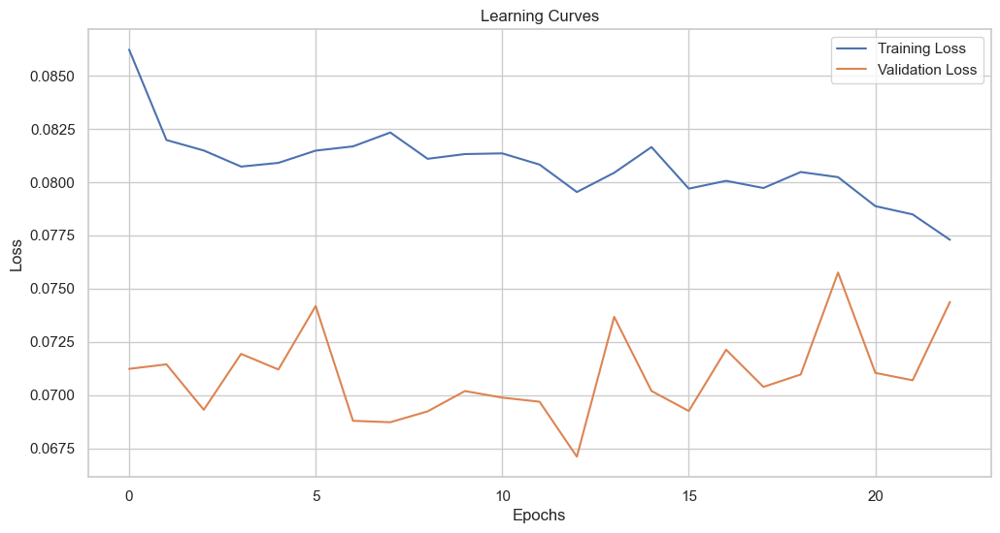

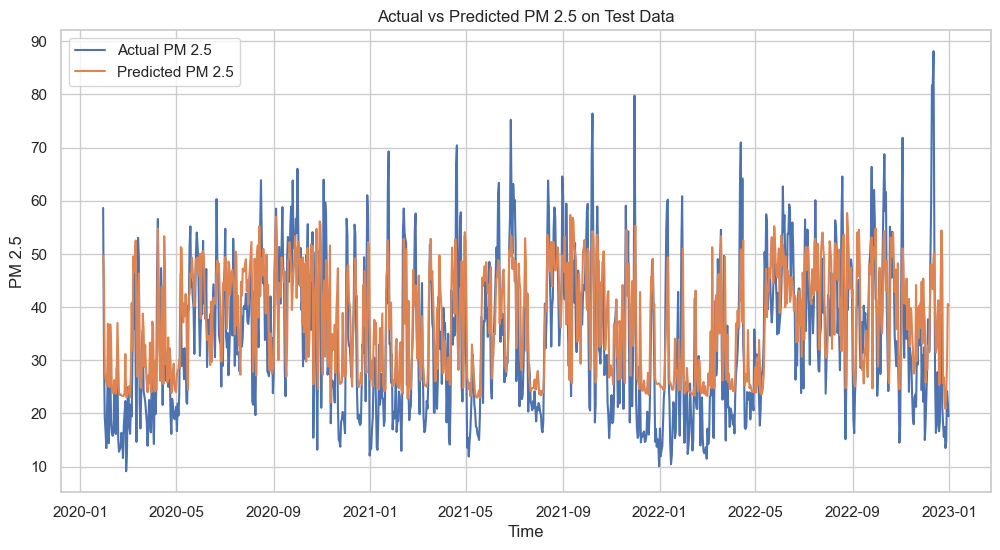

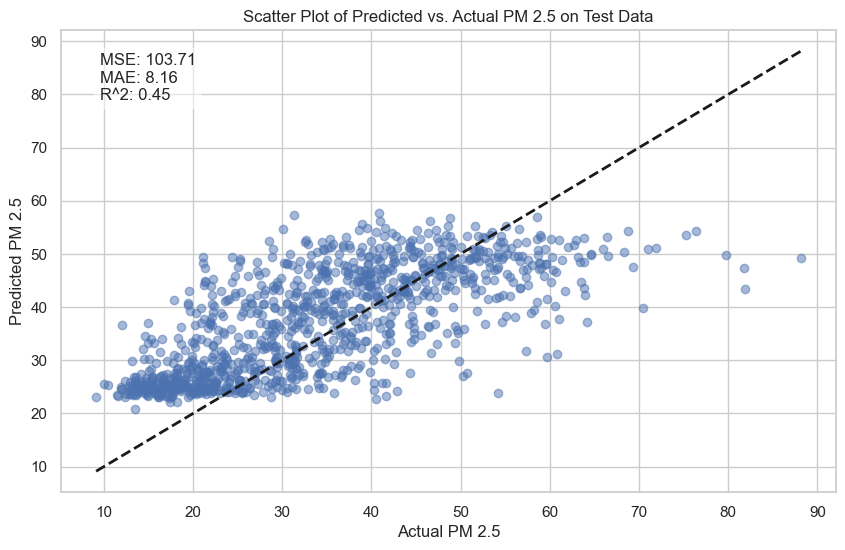

In [223]:
from keras_tuner import RandomSearch
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.layers import LSTM, Dropout, Dense, Input, Conv1D
from tensorflow.keras.models import Sequential
import numpy as np
import pandas as pd
from lime import lime_tabular
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def prepare_data(data, predictors, target, time_steps=1):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[predictors].iloc[i:(i + time_steps)].values)
        y.append(data[target].iloc[i + time_steps])
    return np.array(X), np.array(y)

def build_lstm_cnn_model(hp, time_steps, predictors):
    units_choices = [16, 32, 64]
    filters_choices = [16, 32, 64]
    kernel_sizes = [3, 5, 7]
    
    model = Sequential()
    model.add(Input(shape=(time_steps, len(predictors))))
    
    # Convolutional Layer
    model.add(
        Conv1D(
            filters=hp.Choice('filters', values=filters_choices),
            kernel_size=hp.Choice('kernel_size', values=kernel_sizes),
            activation='relu',
            padding='same',
        )
    )
    model.add(Dropout(rate=hp.Float('cnn_dropout_rate', min_value=0.1, max_value=0.2, step=0.1)))
    
    # LSTM Layers
    model.add(LSTM(units=hp.Choice('units_layer1', values=units_choices), return_sequences=True))
    model.add(Dropout(rate=hp.Float('lstm_dropout_rate1', min_value=0.1, max_value=0.2, step=0.1)))
    model.add(LSTM(units=hp.Choice('units_layer2', values=units_choices)))
    model.add(Dropout(rate=hp.Float('lstm_dropout_rate2', min_value=0.1, max_value=0.2, step=0.1)))
    
    # Output Layer
    model.add(Dense(1))

    model.compile(optimizer=Adam(hp.Choice('learning_rate', values=[0.01, 0.001])),
                loss='mean_absolute_error')
    return model

def build_and_train_lstm_cnn_with_tuning(train_data, validate_data, test_data, predictors, target, time_steps=1, max_trials=10, epochs=100, batch_size=256):
    # Scale data
    scaler = MinMaxScaler()
    train_data_scaled = scaler.fit_transform(train_data[predictors + [target]])
    validate_data_scaled = scaler.transform(validate_data[predictors + [target]])
    test_data_scaled = scaler.transform(test_data[predictors + [target]])

    train_data_scaled = pd.DataFrame(train_data_scaled, columns=predictors + [target])
    validate_data_scaled = pd.DataFrame(validate_data_scaled, columns=predictors + [target])
    test_data_scaled = pd.DataFrame(test_data_scaled, columns=predictors + [target])

    # Prepare time-series data
    X_train, y_train = prepare_data(train_data_scaled, predictors, target, time_steps)
    X_validate, y_validate = prepare_data(validate_data_scaled, predictors, target, time_steps)
    X_test, y_test = prepare_data(test_data_scaled, predictors, target, time_steps)

    # Hyperparameter tuning
    tuner = RandomSearch(
        lambda hp: build_lstm_cnn_model(hp, time_steps, predictors),
        objective='val_loss',
        max_trials=max_trials,
        directory='3hyperparam_tuning',
        project_name='2lstm_cnn_tuning'
    )

    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Learning rate scheduler
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, verbose=1, plateau_num_epochs=3)

    # Measure training start time
    start_time = time.time()

    # Run hyperparameter search
    tuner.search(X_train, y_train, epochs=epochs, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler], batch_size=batch_size)
    
    # Retrieve the best hyperparameters
    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

    # Get the optimal model
    model = tuner.get_best_models(num_models=1)[0]

    # Recompile model to reset optimizer state
    learning_rate = best_hps.get('learning_rate')
    model.compile(optimizer=Adam(learning_rate), loss='mean_absolute_error')

    # Train the model on the full dataset
    history = model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, validation_data=(X_validate, y_validate), callbacks=[early_stop, lr_scheduler])

    # Measure training end time and calculate duration
    end_time = time.time()
    training_duration = end_time - start_time
    print(f"Total training time: {training_duration:.2f} seconds ({training_duration / 60:.2f} minutes)")

    # Generate predictions
    train_predictions = model.predict(X_train)
    validate_predictions = model.predict(X_validate)
    test_predictions = model.predict(X_test)

    # Inverse scale predictions
    train_predictions = scaler.inverse_transform(np.concatenate((train_data_scaled[predictors].iloc[time_steps:].values, train_predictions), axis=1))[:, -1]
    validate_predictions = scaler.inverse_transform(np.concatenate((validate_data_scaled[predictors].iloc[time_steps:].values, validate_predictions), axis=1))[:, -1]
    test_predictions = scaler.inverse_transform(np.concatenate((test_data_scaled[predictors].iloc[time_steps:].values, test_predictions), axis=1))[:, -1]

    # LIME explanation
    X_train_flat = X_train.reshape((X_train.shape[0], X_train.shape[1] * X_train.shape[2]))
    explainer = lime_tabular.LimeTabularExplainer(
        X_train_flat,
        feature_names=predictors * time_steps,
        class_names=[target],
        mode="regression"
    )

    def lime_predict(instance):
        reshaped_instance = instance.reshape((instance.shape[0], time_steps, len(predictors)))
        return model.predict(reshaped_instance)

    instance_to_explain = X_test[0].reshape(1, -1)
    explanation = explainer.explain_instance(instance_to_explain.flatten(), lime_predict)

    explanation.show_in_notebook()

    return model, history, train_predictions, validate_predictions, test_predictions, best_hps, training_duration

# Plot results
def plot_results(history, test_data, test_predictions, target, time_steps):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Learning Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(test_data['date'].iloc[time_steps:], test_data[target].iloc[time_steps:], label='Actual PM 2.5')
    plt.plot(test_data['date'].iloc[time_steps:], test_predictions, label='Predicted PM 2.5')
    plt.title('Actual vs Predicted PM 2.5 on Test Data')
    plt.xlabel('Time')
    plt.ylabel('PM 2.5')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    plt.scatter(test_data[target].iloc[time_steps:], test_predictions, alpha=0.5)
    plt.title('Scatter Plot of Predicted vs. Actual PM 2.5 on Test Data')
    plt.xlabel('Actual PM 2.5')
    plt.ylabel('Predicted PM 2.5')
    plt.plot([test_data[target].min(), test_data[target].max()], [test_data[target].min(), test_data[target].max()], 'k--', lw=2)

    mse = mean_squared_error(test_data[target].iloc[time_steps:], test_predictions)
    mae = mean_absolute_error(test_data[target].iloc[time_steps:], test_predictions)
    r2 = r2_score(test_data[target].iloc[time_steps:], test_predictions)

    plt.text(0.05, 0.95, f'MSE: {mse:.2f}\nMAE: {mae:.2f}\nR^2: {r2:.2f}', transform=plt.gca().transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.5))

    plt.show()

# Define predictors and target
predictors = [
    'ndvi', 'tave', 'tmin', 'heat_index', 'pr', 'wind_speed', 'rh',  'is_holiday', 'is_workday', 'is_long_weekend', 'season' #remove for multicollinearity: 'solar_rad', 'uv_rad', 'tmax', 'weekday_num'
]
target = 'pm25'

# Build and train the model with hyperparameter tuning
model, history, train_predictions, validate_predictions, test_predictions, best_hps, training_duration = build_and_train_lstm_cnn_with_tuning(
    train_data, validate_data, test_data, predictors, target, time_steps=30
)

# Display training time
print(f"Training completed in {training_duration:.2f} seconds ({training_duration / 60:.2f} minutes).")

# Plot the results
plot_results(history, test_data, test_predictions, target, time_steps=30)


In [224]:
# Print best hyperparameters
print("Best Hyperparameters:")
print(f"Filters: {best_hps.get('filters')}")
print(f"Kernel Size: {best_hps.get('kernel_size')}")
print(f"CNN Dropout Rate: {best_hps.get('cnn_dropout_rate')}")
print(f"LSTM Layer 1 Units: {best_hps.get('units_layer1')}")
print(f"LSTM Layer 1 Dropout Rate: {best_hps.get('lstm_dropout_rate1')}")
print(f"LSTM Layer 2 Units: {best_hps.get('units_layer2')}")
print(f"LSTM Layer 2 Dropout Rate: {best_hps.get('lstm_dropout_rate2')}")
print(f"Learning Rate: {best_hps.get('learning_rate')}")

Best Hyperparameters:
Filters: 16
Kernel Size: 3
CNN Dropout Rate: 0.1
LSTM Layer 1 Units: 64
LSTM Layer 1 Dropout Rate: 0.1
LSTM Layer 2 Units: 16
LSTM Layer 2 Dropout Rate: 0.2
Learning Rate: 0.01
